## Analizador Bioimagenes C. elegans - Conteo diferencial de núcleos fluorescentes

### 1 - Instalar librerias necesarias:

In [ ]:
!pip install bioio 
!pip install bioio_bioformats 
!pip install opencv-python
!pip install matplotlib
!pip install seaborn
!pip install scipy

### 2 - Importar librerias necesarias 

In [1]:
from bioio import BioImage 
import bioio_bioformats
import numpy as np  
import cv2 
from scipy import stats as sps
from enum import Enum
import matplotlib.pyplot as plt
import seaborn as sns


### 3 - Ejecutar las Clases Necesarias:

In [2]:
class BioImagenDim(Enum):
    _2D = 2
    _3D = 3
    _4D = 4
    _5D = 5
        
class BioImageHandler():
    '''
        Clase para la manipulación y procesamiento de imagenes biológicas de microscopía, en particular, confocal de fluorescencia.
        La imagen según su formato es convertida a una matriz de tipo compatible según escala de grises. Los analisis se realizan particularmente en tipo uint8.
        Se requiere Java para el empleo de bioio_bioformats. 
    '''
    
    def __init__(self, rutaImagen):
        self.rutaImagen = rutaImagen # Nota , algunos formatos pueden requerir tener sus metadatos en la propia carpeta con el mismo nombre.
        self.img = None # Array uni o multidimensional.
        self.imgArrays = None 
        self.imgMatrizActual = None
    
    def leerBioImage_CV2(self):
        # Función para imagenes 2D tipo .png, .jpg y algunos .tiff
        try:
            img = cv2.imread(self.rutaImagen, cv2.IMREAD_GRAYSCALE)
            self.img = img
            return img
        except Exception as e:
            print(f"Error al leer la imagen: {e}")
            return None   
    
    def leerBioImagen_bioformats(self):
        # Funcion que transforma una iamgen cargada por su ruta en su Array multidimensional según si es una pila de imagenes o no. 
        
        try:
            img = BioImage(self.rutaImagen, reader=bioio_bioformats.Reader)
            self.img = img.data
            return img.data
        except Exception as e:
            print(f"Error al leer la imagen: {e}")
            return None
    
    def tipoArrayImagen(self, img = None):
        # Indica el tipo de int del Array que conforma a la imagen
        
        if img is None:
            img = self.img
        
        return type(img) 
    
    def procesar_shape(self, img = None):
        """
            Función para comprobar el shape de una imagen y desempaquetar la tupla adecuadamente.
    
            Argumentos:
            img -- El array de imagen (puede ser de 2D, 3D, o 4D)
    
            Retorna:
            Un diccionario con las dimensiones de la imagen procesada (alto, ancho, canales, cortes_z, fotogramas, etc.)
            
            # Por ejemplo, el formato .ids/.ics contiene 4 imagenes según el canal, de modo que el shape del array es, por ejemplo, (1, 4, 1, 1024, 1024)
            # El primer 1 indica número de pilas de imágenes (o "z-stack"), es deciar, hay una sola imagen por canal, no un conjunto de imágenes apiladas en el eje Z.
            # El 4 , indica la cantidad de canales que son equivalentes a imagenes por canal. 
            # El tercer 1 indica la cantidad de capturadas por canal. 
            # Los 1024 indica la resolución. 
        """
    
        # Obtener el shape de la imagen
        if img is None:
            img = self.img
        
        shape = img.shape
        print(f"Shape de la imagen: {shape}")
        
        # Definir las funciones que manejan cada tipo de shape
        def procesar_2d(shape):
            # Imagen 2D (escala de grises)
            alto, ancho = shape
            return {'alto': alto, 'ancho': ancho, 'canales': 1, 'cortes_z': 1, 'fotogramas': 1}

        def procesar_3d(shape):
            # Imagen 3D (con canales o apilamiento Z)
            alto, ancho, canales = shape
            return {'alto': alto, 'ancho': ancho, 'canales': canales, 'cortes_z': 1, 'fotogramas': 1}
        
        def procesar_3d_grayscale(shape):
            # Imagen en escala de grises con una dimensión extra (ej. un fotograma)
            alto, ancho, _ = shape
            return {'alto': alto, 'ancho': ancho, 'canales': 1, 'cortes_z': 1, 'fotogramas': 1}
        
        def procesar_4d(shape):
            # Imagen 4D (por ejemplo, stack de imágenes o apilamiento con canales)
            cortes_z, canales, alto, ancho = shape
            return {'cortes_z': cortes_z, 'canales': canales, 'alto': alto, 'ancho': ancho, 'fotogramas': 1}
        
        def procesar_5d(shape):
            # Imagen 5D (stack 3D + canales + fotogramas)
            cortes_z, canales, fotogramas, alto, ancho = shape
            return {'cortes_z': cortes_z, 'canales': canales, 'fotogramas': fotogramas, 'alto': alto, 'ancho': ancho}
        
        # Diccionario simulando el "switch case"
        switch = {
            2: procesar_2d,
            3: procesar_3d,
            4: procesar_4d,
            5: procesar_5d
        }

        # Comprobar el número de dimensiones (len(shape))
        if len(shape) == 3 and shape[2] == 1:
            # Si la imagen es 3D pero con un solo canal (escala de grises)
            return procesar_3d_grayscale(shape)
        
        # Si el número de dimensiones está en el diccionario, usamos la función correspondiente
        if len(shape) in switch:
            return switch[len(shape)](shape)
        else:
            # Si no hay función definida para el número de dimensiones, devolver error
            return {'error': 'Dimensiones no soportadas'}
    
    def obtenerImagenesArray(self, img = None):
        # Recibe un tipo Array multidimensional y lo desarma en una lista de Arrays de facil acceso por índice. 
        # Suelen corresponder a los canales del microscopio 
        # Retorna el puntero a dichos arrays y el tipo del mismo.
        
        if img is None:
            img = self.img
        
        imgArrays = img.squeeze() 
        self.imagenesCanales = imgArrays 
        
        return imgArrays, imgArrays.shape 
    
    def convertirImgArray_AMAtriz(self, imgArray):
        # Convierte un array de una imagen de tipo uintx a una matriz del mismo tipo
        
        matriz_imagen = np.array(imgArray)
        max_value = np.iinfo(matriz_imagen.dtype).max
        if matriz_imagen[0, :].all() == max_value:
            matriz_imagen = matriz_imagen[1:, :]
        elif matriz_imagen[0, :].all() == np.max(matriz_imagen):
            matriz:imagen = matriz_imagen[1:, :]
        self.imgMatrizActual = matriz_imagen
        
        return matriz_imagen
    
    def normalizarImgMatriz(self, imgMatriz = None):
        # Normaliza una matriz que representa una imagen. 
        # Nota: Actualiza la matriz guardada en la clase
        
        if imgMatriz is None:
            imgMatriz = self.imgMatrizActual
        
        imgMatriz = imgMatriz.astype(np.uint16)
    
        # Normalizar los valores al rango [0, 1] basado en el rango real de los datos
        matriz_img_norm = imgMatriz / imgMatriz.max()
        self.imgMatrizActual = matriz_img_norm
        
        return matriz_img_norm
    
    def binarizarImgMatrizNorm(self, imgMatriz = None, threshold = 0.5):
        # Dada una matriz normalizada , la binariza (transforma a 0 y 1) dado cierto threshold para la señal. 
        
        if imgMatriz is None:
            imgMatriz = self.imgMatrizActual
        
        imgBinMatriz = imgMatriz
        imgBinMatriz[imgMatriz > threshold] = 1
        imgBinMatriz[imgMatriz <= threshold] = 0
        imgBinMatriz = imgBinMatriz.astype(np.uint8)
        self.imgMatrizActual = imgBinMatriz
        
        return imgBinMatriz

    def rellenar_agujeros_internos(self, matrizLabeleada, kernel=None, max_iter=50):
        """
        Rellena los ceros internos de cada objeto (label > 0)
        sin superponer otros labels.

        matrizLabeleada : np.ndarray
            Matriz de etiquetas con 0 = fondo y >0 = objetos.
        kernel : np.ndarray | None
            Kernel estructural para la expansión (default: elíptico 3x3).
        max_iter : int
            Iteraciones máximas de expansión.

        Retorna
            matriz_rellenada : np.ndarray
                Nueva matriz de etiquetas con agujeros internos rellenados.
        """
        if kernel is None:
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

        matriz_rellenada = matrizLabeleada.copy()

        for label in np.unique(matrizLabeleada):
            if label == 0:
                continue  # ignorar fondo

            mascara_objeto = (matriz_rellenada == label).astype(np.uint8)

            for iteracion in range(max_iter):
                # Dilatar objeto
                objeto_dilatado = cv2.dilate(mascara_objeto, kernel, iterations=1)

                # Candidatos = dilatación - objeto actual
                candidatos = (objeto_dilatado == 1) & (matriz_rellenada == 0)

                if not np.any(candidatos):
                    break  # nada que rellenar

                # Asignar candidatos solo a este objeto
                matriz_rellenada[candidatos] = label
                mascara_objeto = (matriz_rellenada == label).astype(np.uint8)

        return matriz_rellenada

In [4]:
OFFSET = 9

class WormTracker(BioImageHandler):
    '''
        A partir de una imagen de microcopía de campo claro:
        - Segmentación de la imagen según los gusanos presentes.
        - Precondición : Los gusanos deben de tener un contorno con el fondo negro para que la
        segmentación pueda efectuarse correctamente.
        A partir de un canal de fluorescencia de nucleos:
        - Detección y rotulo de los nucleos.
        - Obtención de un diccionario de tuplas (x,y) de sus coordenadas.
        - Determinación de su centroide.
        - Grafico comparativo de recuadros encerrando el núcleo y del centroide
        - Estadística de la fluorescencia de los nucleos en Unidades Arbitrarias de Fluorescencia.
        - Fluorescencia de núcleos por gusanos.
    '''
    
    def __init__(self, rutaImagen, canalActual = None):
        super().__init__(rutaImagen) # Para herencia de BioImageHandler
        self.canalActual = canalActual
        self.imgArray = None
        self.imgProcesadaArray = None
        self.imgFluo = None
        self.imgFluoProc = None
        self.imgCampoClaro = None
        self.imgCampoClaroProc = None
        self.imgGusanosDetectados = None
        self.imgNucleos = None
        self.imgGusanosRellenados = None
        self.num_gusanos = None
        self.num_nucleos = None # Nota: Se debe restar 1 a este valor, puesto que cuenta al fondo como rotulo 0. 
        self.centroidesGusanos = None
        self.centroidesNucleos = None 
        self.coordenadasGusanos = None
        self.coordenadasNucleos = None
        self.coordenadasNucleosPorGusano = None
        self.fluorescenciasPorGusano = None
        self.fluorescenciasPorGusanoCorregido = None
        self.figuraGusanos = None
        self.figuraGraficoViolin = None
        
    def procesarImagen(self, tipo=BioImagenDim._3D,
                   canalFluo=1, canalCampoClaro=3,
                   thresholdFluo=0.5, thresholdCampoClaro=0.275):
        """
        Procesa todos los canales de la imagen en paralelo, aplicando distintos
        thresholds según si el canal corresponde a fluorescencia o campo claro.

        Devuelve:
            - imgArray: lista de imágenes originales (por canal).
            - imgProcesadaArray: lista de imágenes procesadas (por canal).
        """

        # Lectura de la imagen
        if tipo == BioImagenDim._2D:
            img = super().leerBioImage_CV2()
        else:
            img = super().leerBioImagen_bioformats()

        if img is None:
            print("No image loaded")
            return None, None

        # Procesar forma
        forma_imagen = super().procesar_shape(img)

        # Extraer arrays de canales
        if forma_imagen["canales"] > 1:
            imgArrays, _ = super().obtenerImagenesArray(img)
        else:
            imgArrays = [img]

        imgProcesadaArray = []

        # Definir configuración de thresholds por tipo de canal
        config_canales = {
            canalFluo: thresholdFluo,
            canalCampoClaro: thresholdCampoClaro
        }

        # Procesar cada canal
        for i, canal_img in enumerate(imgArrays):
            canal_proc = super().convertirImgArray_AMAtriz(canal_img)
            canal_proc = super().normalizarImgMatriz(canal_proc)

            if i in config_canales:
                threshold = config_canales[i]
                canal_proc = super().binarizarImgMatrizNorm(canal_proc, threshold)

            imgProcesadaArray.append(canal_proc)

        # Guardar en atributos
        self.imgArray = imgArrays
        self.imgProcesadaArray = imgProcesadaArray

        # Guardar alias útiles
        if canalCampoClaro < len(imgArrays):
            self.imgCampoClaro = imgArrays[canalCampoClaro]
            self.imgCampoClaroProc = imgProcesadaArray[canalCampoClaro]
        if canalFluo < len(imgArrays):
            self.imgFluo = imgArrays[canalFluo]
            self.imgFluoProc = imgProcesadaArray[canalFluo]

        return imgArrays, imgProcesadaArray

    
    def seleccionarCanal(self, canal=0):
        '''
            Selecciona un canal de la imagen y de la imagen procesada.
            Actualiza:
                - self.imgActual
                - self.imgProcesada
            Retorna: (imgCanal, imgProcesadaCanal)
        '''
        if not hasattr(self, "imgArray") or not hasattr(self, "imgProcesadaArray"):
            print("Debe llamar primero a procesarImagen()")
            return None, None
        
        if canal < 0 or canal >= len(self.imgArray):
            print(f"Canal inválido. Disponible: 0–{len(self.imgArray)-1}")
            return None, None
        
        self.imgActual = self.imgArray[canal]
        self.imgProcesada = self.imgProcesadaArray[canal]
        
        return self.imgActual, self.imgProcesada

    def buscarGusanos(self, imgBinaria = None, tol_cerrada_1 = 1, tol_cerrada_2 = 1,
                    iteraciones = 6, con_rellenado_inundacion = False, min_area = 100,
                    tol_rellenado_1 = 1, tol_rellenado_2 = 2, max_iteracion = 30):

        if imgBinaria is None:
            imgBinaria = self.imgCampoClaroProc

        #  Dimensiones de la imagen
        h, w = imgBinaria.shape

        # 1- Cierre morfológico con kernel pequeño para cerrar agujeros internos
        kernel_cerrado = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (tol_cerrada_1, tol_cerrada_2))
        matriz_bin_cerrada = cv2.morphologyEx(imgBinaria, cv2.MORPH_CLOSE, kernel_cerrado, iterations= iteraciones)
        # Esti hace dilatación seguida de erosión: Para cerrar agujeros pequeños o discontinuidades.

        # 2 - Invertir y rellenar fondo
        if con_rellenado_inundacion:
            img_rellenadoInunacion = matriz_bin_cerrada.copy()
            mascara = np.zeros((h+2, w+2), np.uint8)
            cv2.floodFill(img_rellenadoInunacion, mascara, (0,0), 255)
            img_rellenadoInunacion_inv = cv2.bitwise_not(img_rellenadoInunacion)
            matriz_rellenada = matriz_bin_cerrada | img_rellenadoInunacion_inv
            # Se rellena con OR bit a bit : Se conservan los originales y se rellan los internos
        else:
            matriz_rellenada = matriz_bin_cerrada

        # 3 - Conectar las pixeles cercanos para definir los grupos
        num_gusanos, gusanos, estadisticas, centroids = cv2.connectedComponentsWithStats(matriz_rellenada, connectivity=8)

        # 4 - Correción de los valores (Evitar que el "label" '0' se cuente como tal)
        
        gusanos_offset = gusanos.copy()
        gusanos_offset[gusanos_offset > 0] += OFFSET

        # Reconstruir estadisticas y centroids con OFFSET
        estadisticas_offset = np.zeros((num_gusanos + OFFSET, estadisticas.shape[1]), dtype=estadisticas.dtype)
        centroids_offset = np.zeros((num_gusanos + OFFSET, centroids.shape[1]), dtype=centroids.dtype)


        # Copiar estadisticas y centroids a sus nuevas posiciones
        estadisticas_offset[OFFSET:] = estadisticas
        centroids_offset[OFFSET:] = centroids

        # Eliminar objetos de baja área
        mascara = np.zeros_like(gusanos_offset, dtype=np.uint8)
        for i in range(OFFSET, num_gusanos + OFFSET):
            if estadisticas_offset[i, cv2.CC_STAT_AREA] >= min_area:
                mascara[gusanos_offset == i] = 255

        num_gusanos, gusanos, estadisticas, centroids = cv2.connectedComponentsWithStats(mascara, connectivity=8)

        if tol_rellenado_1 is None and tol_rellenado_2 is None:
            kernel_rellenado = None
        else:
            kernel_rellenado = cv2.getStructuringElement(cv2.MORPH_RECT, (tol_rellenado_1, tol_rellenado_2))
            
        gusanos_rellenos = super().rellenar_agujeros_internos(matrizLabeleada=gusanos, kernel=kernel_rellenado, max_iter=50)

        centroides = {}
        for gusano in range(1, num_gusanos):
            coordenadas = np.column_stack(np.where(gusanos == gusano))
            centroide = centroids[gusano] = np.mean(coordenadas, axis=0)
            centroides[f"gusano_{gusano}"] = (int(centroide[0]), int(centroide[1]))

        self.num_gusanos = num_gusanos 
        self.imgGusanosDetectados = gusanos
        self.imgGusanosRellenados = gusanos_rellenos
        self.centroidesGusanos = centroides 
        
        return num_gusanos, gusanos, estadisticas, centroides
    
    def _extraer_objetos(self, img_segmentada, num_objetos, prefix="objeto", devolver="coordenadas"):
        """
        Función auxiliar para obtener coordenadas o centroides de objetos en una imagen segmentada.

        Parámetros:
        -----------
        img_segmentada : np.ndarray
            Imagen segmentada con etiquetas (ej: salida de connectedComponents).
        num_objetos : int
            Número de objetos esperados (máximo label).
        prefix : str
            Prefijo para los keys del diccionario (ej: "nucleo", "gusano").
        devolver : str
            Qué devolver por objeto:
                - "coordenadas": set de tuplas con coordenadas.
                - "centroide": tupla con fila, columna del centroide.

        Retorna:
        --------
        dict : {"<prefix>_1": data, ..., "<prefix>_N": data}
        """
        resultados = {}
        for i in range(1, num_objetos):  # comienza en 1 porque 0 es fondo
            coords = np.column_stack(np.where(img_segmentada == i))

            if coords.size == 0:
                continue  # por si hay huecos
            
            if devolver == "coordenadas":
                coords_tuplas = [tuple(c) for c in coords]
                resultados[f"{prefix}_{i}"] = set(coords_tuplas)

            elif devolver == "centroide":
                centroide = coords.mean(axis=0)
                resultados[f"{prefix}_{i}"] = (int(centroide[0]), int(centroide[1]))

        return resultados
        
    def coordenadasDeGusanos(self, num_gusanos=None, gusanos_rellenados=None):
        
        if num_gusanos is None:
            num_gusanos = self.num_gusanos
        if gusanos_rellenados is None:
            gusanos_rellenados = self.imgGusanosRellenados
        
        self.coordenadasGusanos = self._extraer_objetos(
            gusanos_rellenados, num_gusanos, prefix="gusano", devolver="coordenadas"
        )
        return self.coordenadasGusanos

    def buscarNucleos(self, imgBinaria = None, canal = 1, tol_cerrada = 5, tol_abierta = 5):
        '''
            Toma una imagen binarizada de un canal de fluorescencia donde hay emisión desde nucleos y la procesa
            para rotular los grupos de pixeles correspondientes a cada nucleo. Realiza la siguientes operaciones:
            - Cierre morfológico : Une los huecos pequeños (tolerancia)
            - Apertura morfológica : elimina los objetos muy pequeños (Filtrado por tamaño)
            - Detectar componentes finales
        '''
        
        if imgBinaria is None:
            imgBinaria = self.imgFluoProc
        
        # 1 - Cierre morfológico
        kernel_cerrado = np.ones((tol_cerrada, tol_cerrada), np.uint8)  # tamaño del kernel = tolerancia a ceros internos
        matriz_bin_cerrada = cv2.morphologyEx(imgBinaria, cv2.MORPH_CLOSE, kernel_cerrado)

        # 2 - Apertura morfológica 
        kernel_abierto = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (tol_abierta, tol_abierta))
        mascara_filtrada = cv2.morphologyEx(matriz_bin_cerrada, cv2.MORPH_OPEN, kernel_abierto)

        # 3 - Detectar nucleos
        num_nucleos_filtrados, nucleos_filtrados = cv2.connectedComponents(mascara_filtrada, connectivity=8)

        self.num_nucleos = num_nucleos_filtrados
        self.imgNucleos = nucleos_filtrados
        
        return num_nucleos_filtrados, nucleos_filtrados


    def coordenadasDeNucleos(self, num_nucleos=None, nucleos_filtrados=None):
        if num_nucleos is None:
            num_nucleos = self.num_nucleos
        if nucleos_filtrados is None:
            nucleos_filtrados = self.imgNucleos
        
        self.coordenadasNucleos = self._extraer_objetos(
            nucleos_filtrados, num_nucleos, prefix="nucleo", devolver="coordenadas"
        )
        return self.coordenadasNucleos


    def centroidesDeNucleos(self, num_nucleos=None, nucleos_filtrados=None):
        if num_nucleos is None:
            num_nucleos = self.num_nucleos
        if nucleos_filtrados is None:
            nucleos_filtrados = self.imgNucleos
        
        self.centroidesNucleos = self._extraer_objetos(
            nucleos_filtrados, num_nucleos, prefix="nucleo", devolver="centroide"
        )
        return self.centroidesNucleos
    
    def interseccionGusanoNucleos(self, coordenadasGusanos = None, coordenadasNucleos = None):
        
        if coordenadasGusanos is None:
            coordenadasGusanos = self.coordenadasGusanos
        if coordenadasNucleos is None:
            coordenadasNucleos = self.coordenadasNucleos
        
        coordenadasNucleosPorGusano = dict()

        for gusano_id, coordenadas_gusano in coordenadasGusanos.items():
            nucleos_en_gusano = dict()  # nuevo diccionario para este gusano
            
            for nucleo_id, coordenadas_nucleo in coordenadasNucleos.items():
                interseccion = coordenadas_gusano & coordenadas_nucleo
                if interseccion:
                    nucleos_en_gusano[nucleo_id] = interseccion

            coordenadasNucleosPorGusano[gusano_id] = nucleos_en_gusano

        self.coordenadasNucleosPorGusano = coordenadasNucleosPorGusano
        return coordenadasNucleosPorGusano    

    def graficarProcesamiento(self,
                          modos=None,
                          imgOriginal=None,
                          imgFluo=None,
                          imgGusanosDetectados=None,
                          imgGusanosRellenados=None,
                          imgNucleos=None,
                          coordenadasGusanos=None,
                          coordenadasNucleos=None,
                          coordenadasNucleosPorGusano=None,
                          centroidesGusanos=None,
                          centroidesNucleos=None,
                          titulo="Imagen",
                          fontsize=24,
                          cmap_gusanos="Oranges",
                          cmap_nucleos="PiYG",
                          centroideON=True,
                          rotulosON=False,
                          rotulosGusanosON=True,
                          rectanguloON=True):
        """
        Graficar pipeline de procesamiento de gusanos y núcleos.

        modos: lista con enteros que indican qué mostrar
            0 - Imagen original
            1 - Gusanos detectados
            2 - Gusanos rellenados
            3 - Núcleos detectados
            4 - Merge núcleos-gusanos

        Si modos=None → se muestran todos [0,1,2,3,4].
        """

        # Defaults
        if modos is None:
            modos = [0, 1, 2, 3, 4]
        if imgOriginal is None:
            imgOriginal = self.imgCampoClaro
        if imgFluo is None:
            imgFluo = self.imgFluo
        if imgGusanosDetectados is None:
            imgGusanosDetectados = self.imgGusanosDetectados
        if imgGusanosRellenados is None:
            imgGusanosRellenados = self.imgGusanosRellenados
        if imgNucleos is None:
            imgNucleos = self.imgNucleos
        if coordenadasGusanos is None:
            coordenadasGusanos = self.coordenadasGusanos
        if coordenadasNucleos is None:
            coordenadasNucleos = self.coordenadasNucleos
        if coordenadasNucleosPorGusano is None:
            coordenadasNucleosPorGusano = self.coordenadasNucleosPorGusano
        if centroidesGusanos is None:
            centroidesGusanos = getattr(self, "centroidesGusanos", {})
        if centroidesNucleos is None:
            centroidesNucleos = getattr(self, "centroidesNucleos", {})

        # --- Layout dinámico ---
        n_plots = len(modos)
        max_cols = 2
        n_cols = min(n_plots, max_cols)
        n_rows = int(np.ceil(n_plots / max_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
        axes = np.atleast_2d(axes)

        # ------------------- LOOP -------------------
        for idx, modo in enumerate(modos):
            row, col = divmod(idx, max_cols)
            ax = axes[row, col]
            ax.axis("off")

            if modo == 0:
                ax.imshow(imgOriginal, cmap="gray")
                ax.set_title(titulo + " - Original", fontsize=fontsize, fontweight="bold")

            elif modo == 1:
                ax.imshow(imgGusanosDetectados, cmap="gray")
                ax.set_title("Gusanos detectados", fontsize=fontsize, fontweight="bold")
                if centroideON:
                    for g_id, (fila, colc) in centroidesGusanos.items():
                        ax.plot(colc, fila, "rx", markersize=4)

            elif modo == 2:
                ax.imshow(imgGusanosRellenados, cmap=cmap_gusanos)
                ax.set_title("Gusanos rellenados", fontsize=fontsize, fontweight="bold")
                if centroideON:
                    for g_id, (fila, colc) in centroidesGusanos.items():
                        ax.plot(colc, fila, "gx", markersize=4)

            elif modo == 3:
                ax.imshow(imgFluo, cmap="gray")
                ax.set_title("Núcleos detectados", fontsize=fontsize, fontweight="bold")
                for n_id, (fila, colc) in centroidesNucleos.items():
                    if centroideON:
                        ax.plot(colc, fila, "gx", markersize=4)
                    if rotulosON:
                        ax.text(colc + 10, fila, n_id, color="yellow", fontsize=7)
                    if rectanguloON and n_id in coordenadasNucleos:
                        coords = np.array(list(coordenadasNucleos[n_id]))
                        min_f, min_c = coords.min(axis=0)
                        max_f, max_c = coords.max(axis=0)
                        rect = plt.Rectangle((min_c, min_f),
                                            max_c - min_c,
                                            max_f - min_f,
                                            edgecolor="red",
                                            facecolor="none",
                                            linewidth=1)
                        ax.add_patch(rect)

            elif modo == 4:
                imgFinal = np.ones((*imgOriginal.shape, 3), dtype=np.uint8) * 255
                cmap_g = plt.get_cmap(cmap_gusanos, len(coordenadasGusanos))
                cmap_n = plt.get_cmap(cmap_nucleos, len(coordenadasGusanos))

                # Pintar gusanos
                for i, (gusano_id, _) in enumerate(coordenadasNucleosPorGusano.items()):
                    color_gusano = (np.array(cmap_g(i)[:3]) * 200).astype(np.uint8)
                    for (fila, colc) in coordenadasGusanos[gusano_id]:
                        imgFinal[fila, colc] = color_gusano
                    if rotulosGusanosON:
                        ax.text(colc + 17, fila, gusano_id, color="black", fontsize=10, fontweight="bold")

                # Pintar núcleos encima
                for i, (gusano_id, nucleos_dict) in enumerate(coordenadasNucleosPorGusano.items()):
                    color_nucleo = (np.array(cmap_n(i)[:3]) * 255).astype(np.uint8)
                    for coords in nucleos_dict.values():
                        for (fila, colc) in coords:
                            imgFinal[fila, colc] = color_nucleo

                ax.imshow(imgFinal)
                ax.set_title("Núcleos por gusano", fontsize=fontsize, fontweight="bold")

            else:
                raise ValueError("Modo no válido. Usa 0–4.")

        # Apagar subplots vacíos
        for idx in range(n_plots, n_rows * n_cols):
            row, col = divmod(idx, max_cols)
            axes[row, col].axis("off")

        plt.tight_layout()

        self.figuraGusanos = fig

        plt.show()
    

    def fluorescencia_de_nucleos(self, dictNucleosPorGusano=None, imgFluo=None):
        """
        Convierte coordenadas de píxeles en valores de fluorescencia total por núcleo.

        Argumentos
        ----------
        dictNucleosPorGusano : dict
            {"gusano_1": {"nucleo_1": {(x1,y1), (x2,y2), ...}, ...}, ...}
        imgFluo : np.ndarray
            Imagen de fluorescencia.

        Retorna
        -------
        fluorescenciasPorGusano : dict
            {"gusano_1": {"nucleo_1": valor_total, ...}, ...}
        """
        if dictNucleosPorGusano is None:
            dictNucleosPorGusano = self.coordenadasNucleosPorGusano
        if imgFluo is None:
            imgFluo = self.imgFluo

        fluorescenciasPorGusano = {}

        for gusano, nucleos in dictNucleosPorGusano.items():
            fluorescenciasPorGusano[gusano] = {}
            for nucleo, coords in nucleos.items():
                valores = [imgFluo[fila, col] for (fila, col) in coords]
                fluorescenciasPorGusano[gusano][nucleo] = float(np.sum(valores))

        self.fluorescenciasPorGusano = fluorescenciasPorGusano

        return fluorescenciasPorGusano

    def estadistica_fluorescencias(self, fluorescenciasPorGusano = None):
        """
        Calcula estadísticas de fluorescencia a partir de un dict de valores.

        Argumentos
        ----------
        fluorescenciasPorGusano : dict
            {"gusano_1": {"nucleo_1": valor, ...}, ...}

        Retorna
        -------
        estadisticasPorGusano : dict
            {"gusano_1": {"media": ..., "std": ..., "cv": ...}, ...}
        """
        if fluorescenciasPorGusano is None:
            fluorescenciasPorGusano = self.fluorescenciasPorGusano
        
        estadisticasPorGusano = {}

        for gusano, nucleos_dict in fluorescenciasPorGusano.items():
            valores = list(nucleos_dict.values())
            if len(valores) > 0:
                media = float(np.mean(valores))
                std = float(np.std(valores, ddof=1)) if len(valores) > 1 else 0.0
                cv = float(std / media) if media != 0 else np.nan
            else:
                media, std, cv = np.nan, np.nan, np.nan

            estadisticasPorGusano[gusano] = {
                "media": media,
                "std": std,
                "cv": cv
            }

        return estadisticasPorGusano

    def eliminar_outliers(self,
                        fluorescenciasPorGusano=None,
                        imgFluo=None,
                        metodo="iqr",
                        sigmaX=2.5,
                        IQRX=1.0):
        """
        Detecta y elimina outliers en los valores de fluorescencia de los núcleos por gusano.

        Parameters
        ----------
        fluorescenciasPorGusano : dict or None
            {"gusano_1": {"nucleo_1": valor, ...}, ...}
            Si None, usa self.fluorescenciasPorGusano.
        imgFluo : np.ndarray (opcional)
            Imagen de fluorescencia (no necesaria si ya trabajamos con valores).
        metodo : {"sigma","iqr"}
        sigmaX : float
            número de desviaciones para criterio sigma.
        IQRX : float
            multiplicador para criterio IQR.

        Returns
        -------
        resultados : dict
            Informe con outliers por gusano.
        fluorescenciasPorGusano_clean : dict
            Diccionario corregido sin outliers.
        estadisticasPorGusano_clean : dict
            Estadísticas recalculadas después de limpiar (media, std, cv).
        """
        
        # usar atributo si no se da input
        if fluorescenciasPorGusano is None:
            fluorescenciasPorGusano = getattr(self, "fluorescenciasPorGusano", None)
            if fluorescenciasPorGusano is None:
                raise ValueError("No hay fluorescenciasPorGusano ni se pasó por argumento.")

        resultados = {}
        fluorescenciasPorGusano_clean = {}

        for gusano, nucleos_dict in fluorescenciasPorGusano.items():
            # asegurar dict y tipos
            if not isinstance(nucleos_dict, dict):
                raise ValueError(f"Formato inválido para {gusano}: se esperaba dict de núcleos.")

            valores = np.array(list(nucleos_dict.values()), dtype=float) if len(nucleos_dict) > 0 else np.array([])
            nucleos = list(nucleos_dict.keys())
            outliers = {}
            clean_dict = nucleos_dict.copy()

            if metodo == "sigma":
                if len(valores) == 0:
                    outliers = {}
                    clean_dict = {}
                else:
                    mean = float(np.mean(valores))
                    std = float(np.std(valores, ddof=1)) if len(valores) > 1 else 0.0
                    lim_inf, lim_sup = mean - sigmaX * std, mean + sigmaX * std
                    outliers = {n: float(v) for n, v in nucleos_dict.items() if (v < lim_inf or v > lim_sup)}
                    clean_dict = {n: float(v) for n, v in nucleos_dict.items() if n not in outliers}

            elif metodo == "iqr":
                if len(valores) == 0:
                    outliers = {}
                    clean_dict = {}
                else:
                    Q1, Q3 = np.percentile(valores, [25, 75])
                    IQR = Q3 - Q1
                    lim_inf, lim_sup = Q1 - IQRX * IQR, Q3 + IQRX * IQR
                    outliers = {n: float(v) for n, v in nucleos_dict.items() if (v < lim_inf or v > lim_sup)}
                    clean_dict = {n: float(v) for n, v in nucleos_dict.items() if n not in outliers}

            else:
                raise ValueError("Método no reconocido. Usa 'grubbs', 'sigma' o 'iqr'.")

            resultados[gusano] = {
                "outliers": outliers,
                "valores": {k: float(v) for k, v in nucleos_dict.items()},
                "hay_outliers": len(outliers) > 0
            }
            fluorescenciasPorGusano_clean[gusano] = clean_dict

        # Recalcular estadísticas con dict limpio (usa tu función diseñada)
        estadisticasPorGusano_clean = self.estadistica_fluorescencias(fluorescenciasPorGusano_clean)

        # guardar en el objeto para uso posterior
        self.fluorescenciasPorGusanoCorregido = fluorescenciasPorGusano_clean

        return resultados, fluorescenciasPorGusano_clean, estadisticasPorGusano_clean    

    def graficar_violin_outliers(self,
                                fluorescenciasPorGusano_pre=None,
                                fluorescenciasPorGusano_post=None,
                                titulo="Comparación de fluorescencia por gusano",
                                dot_size=5,
                                dot_alpha=0.4):
        """
        Grafica violin plots estilizados antes y después de filtrar outliers.
        
        Parameters
        ----------
        fluorescenciasPorGusano_pre : dict
            Diccionario antes de filtrar {"gusano_1": {"nucleo_1": valor, ...}, ...}
        fluorescenciasPorGusano_post : dict
            Diccionario después de filtrar (mismo formato).
        titulo : str
            Título principal de la figura.
        dot_size : int or float
            Tamaño de los puntos en el stripplot.
        dot_alpha : float (0-1)
            Transparencia de los puntos en el stripplot.
        """
        if fluorescenciasPorGusano_pre is None:
            fluorescenciasPorGusano_pre = self.fluorescenciasPorGusano
        if fluorescenciasPorGusano_post is None:
            fluorescenciasPorGusano_post = self.fluorescenciasPorGusanoCorregido
            
        def dict_to_lists(diccionario):
            gusanos, valores = [], []
            for gusano, nucleos_dict in diccionario.items():
                for _, valor in nucleos_dict.items():
                    gusanos.append(gusano)
                    valores.append(valor)
            return gusanos, valores

        gus_pre, val_pre = dict_to_lists(fluorescenciasPorGusano_pre)
        gus_post, val_post = dict_to_lists(fluorescenciasPorGusano_post)

        fig, axes = plt.subplots(1, 2, figsize=(16, 7), sharey=True)
        plt.suptitle(titulo, fontsize=25, fontweight="bold")

        # ----------- Pre -----------
        sns.violinplot(x=gus_pre, y=val_pre, hue=gus_pre,
                    inner=None, linewidth=1,
                    palette="Blues", legend=False, ax=axes[0])
        sns.stripplot(x=gus_pre, y=val_pre,
                    color="black", size=dot_size, alpha=dot_alpha, ax=axes[0])
        sns.pointplot(x=gus_pre, y=val_pre,
                    color="red", markers="D", linestyle="none",
                    markersize=6, errorbar="sd", ax=axes[0])
        axes[0].set_title("Antes de filtrar outliers", fontsize=14, fontweight="bold")
        axes[0].set_xlabel("Gusano")
        axes[0].set_ylabel("Fluorescencia")
        axes[0].set_ylim(bottom=0)

        # ----------- Post -----------
        sns.violinplot(x=gus_post, y=val_post, hue=gus_post,
                    inner=None, linewidth=1,
                    palette="Oranges", legend=False, ax=axes[1])
        sns.stripplot(x=gus_post, y=val_post,
                    color="black", size=dot_size, alpha=dot_alpha, ax=axes[1])
        sns.pointplot(x=gus_post, y=val_post,
                    color="red", markers="D", linestyle="none",
                    markersize=6, errorbar="sd", ax=axes[1])
        axes[1].set_title("Después de filtrar outliers", fontsize=16, fontweight="bold")
        axes[1].set_xlabel("Gusano")
        axes[1].set_ylabel("Fluorescencia", fontsize=15, fontweight="bold")
        axes[1].set_ylim(bottom=0)

        # Ajustes comunes
        for ax in axes:
            ax.grid(axis="y", linestyle="--", alpha=0.5)
            ax.tick_params(axis="x", rotation=30)

        plt.tight_layout(rect=[0, 0, 1, 0.96])

        self.figuraGraficoViolin = fig

        plt.show()

### 4 - Ejemplo de Uso

##### Ruta del archivo:

In [9]:
import os

# Ruta base donde están los archivos
ruta_base = "/home/nephelim/Descargas/Radsmad_C_elegans_2_10/"

# Archivo que contiene la lista de nombres
archivo_lista = ruta_base + "nombres_lon_2.txt"

# Leer los nombres y armar paths completos
with open(archivo_lista, "r", encoding="utf-8") as f:
    nombres_archivos = [line.strip() for line in f if line.strip()]

rutas_completas = [os.path.join(ruta_base, nombre) for nombre in nombres_archivos]

#### Ejecución de prueba 

Nota: Los errores de Java son por parseo de los metadatos de los archivos de imagen.

In [10]:
wormTrackers = []
for ruta in rutas_completas:
    wormTrackers.append(WormTracker(ruta))

13:53:39.471 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 1.ics
13:53:39.471 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 1.ics
13:53:39.471 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 1.ics)
13:53:39.471 [main] INFO loci.formats.FormatHandler - Finding companion file
13:53:39.471 [main] INFO loci.formats.FormatHandler - Checking file version
13:53:39.477 [main] INFO loci.formats.FormatHandler - Reading metadata
13:53:39.503 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


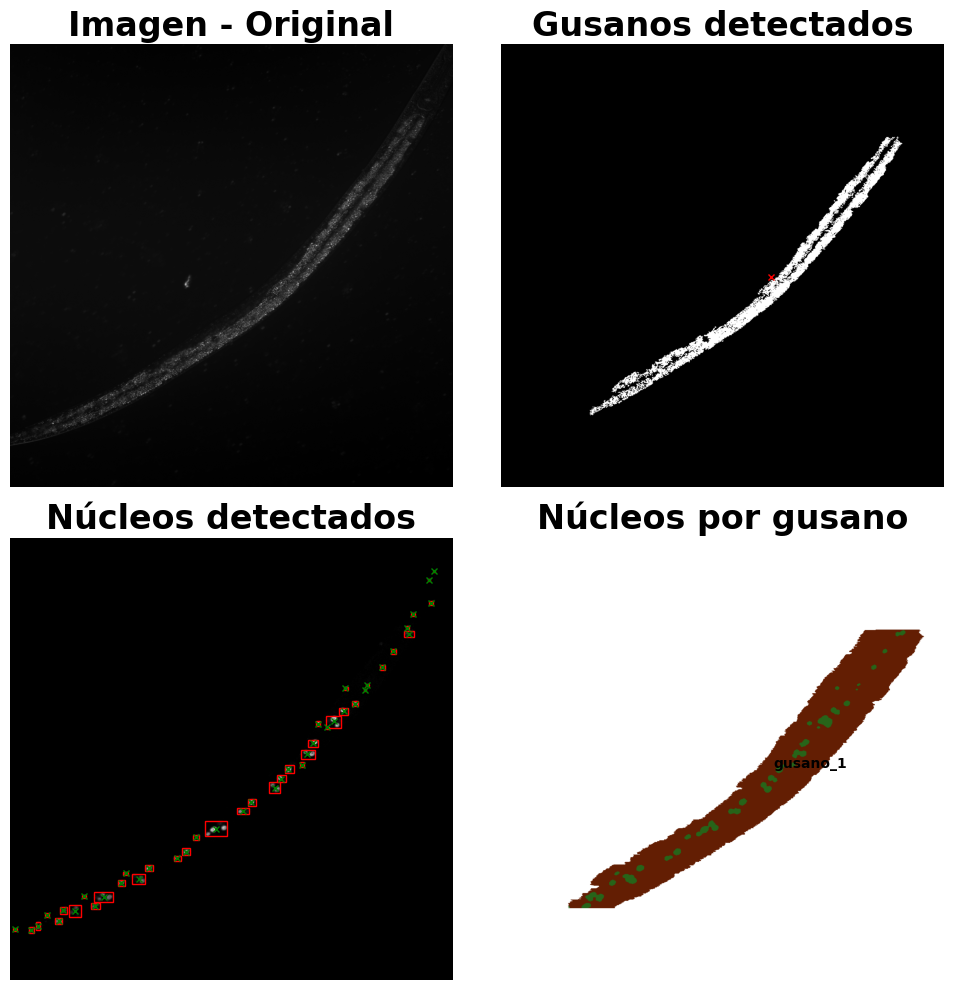

13:53:49.439 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 2.ics
13:53:49.439 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 2.ics
13:53:49.439 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 2.ics)
13:53:49.440 [main] INFO loci.formats.FormatHandler - Finding companion file
13:53:49.440 [main] INFO loci.formats.FormatHandler - Checking file version
13:53:49.441 [main] INFO loci.formats.FormatHandler - Reading metadata
13:53:49.480 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

KeyboardInterrupt: 

In [ ]:
estadisticas_fluorescencias = []
for tracker in wormTrackers:
    tracker.procesarImagen(thresholdCampoClaro=0.25, thresholdFluo=0.05)
    tracker.buscarNucleos(tol_cerrada = 5, tol_abierta = 5)
    tracker.coordenadasDeNucleos()
    tracker.centroidesDeNucleos()
    tracker.buscarGusanos(iteraciones=8, con_rellenado_inundacion=False,
                                min_area=3500, tol_rellenado_1=3, tol_rellenado_2=1, max_iteracion=10)
    tracker.coordenadasDeGusanos()
    tracker.interseccionGusanoNucleos()
    tracker.graficarProcesamiento(modos=[0, 1, 3, 4])
    tracker.fluorescencia_de_nucleos()
    _, _, estadisticas = tracker.eliminar_outliers()
    estadisticas_fluorescencias.append(estadisticas)
    #tracker.graficar_violin_outliers(titulo="Comparación de fluorescencia por gusano")

In [15]:
def graficar_violin_outliers_multiple(
        wormTrackers,
        titulo="Comparación de fluorescencia por gusano",
        dot_size=5,
        dot_alpha=0.4,
        ylim_pre=None,
        ylim_post=None,
        label="WT"):
    """
    Grafica violin plots de fluorescencia para varias instancias de WormTracker.
    Cada instancia tiene su propio bloque en el eje X y se muestran los gusanos.
    Dos filas: arriba pre-filtrado, abajo post-filtrado.

    Parameters
    ----------
    wormTrackers : list
        Lista de objetos WormTracker con atributos:
            - fluorescenciasPorGusano
            - fluorescenciasPorGusanoCorregido
            - nombre (opcional, para mostrar en el eje X)
    dot_size : float
        Tamaño de los puntos en stripplot
    dot_alpha : float
        Transparencia de los puntos en stripplot
    ylim_pre : tuple or None
        (min, max) para el eje Y del gráfico pre-filtrado. Si None, ajusta automático.
    ylim_post : tuple or None
        (min, max) para el eje Y del gráfico post-filtrado. Si None, ajusta automático.
    """

    def extract_xy(wormTrackers, post=False):
        x_labels, y_values = [], []
        for idx, tracker in enumerate(wormTrackers):
            dicc = tracker.fluorescenciasPorGusanoCorregido if post else tracker.fluorescenciasPorGusano
            instancia = getattr(tracker, "nombre", f"{label} {idx+1}")
            for gusano, nucleos in dicc.items():
                for _, val in nucleos.items():
                    x_labels.append(f"{instancia} - {gusano}")
                    y_values.append(val)
        return x_labels, y_values

    # Pre y post
    x_pre, y_pre = extract_xy(wormTrackers, post=False)
    x_post, y_post = extract_xy(wormTrackers, post=True)

    fig, axes = plt.subplots(2, 1, figsize=(20, 12))  #  sin sharey para independencia de limite del eje y
    plt.suptitle(titulo, fontsize=25, fontweight="bold")

    # ----------- Pre-filtrado -----------
    sns.violinplot(x=x_pre, y=y_pre, hue=x_pre,
                   inner=None, linewidth=1, legend=False,
                   palette="Blues", ax=axes[0])
    sns.stripplot(x=x_pre, y=y_pre, color="black", size=dot_size, alpha=dot_alpha, ax=axes[0])
    sns.pointplot(x=x_pre, y=y_pre, color="red", markers="D", linestyle="none",
                  markersize=6, errorbar="sd", ax=axes[0])
    axes[0].set_title("Pre-filtrado (todas las imágenes)", fontsize=16, fontweight="bold")
    axes[0].set_ylabel("Fluorescencia")
    axes[0].grid(axis="y", linestyle="--", alpha=0.5)
    axes[0].tick_params(axis="x", rotation=60)
    if ylim_pre is not None:
        axes[0].set_ylim(ylim_pre)

    # ----------- Post-filtrado -----------
    sns.violinplot(x=x_post, y=y_post, hue=x_post,
                   inner=None, linewidth=1, legend=False,
                   palette="Oranges", ax=axes[1])
    sns.stripplot(x=x_post, y=y_post, color="black", size=dot_size, alpha=dot_alpha, ax=axes[1])
    sns.pointplot(x=x_post, y=y_post, color="red", markers="D", linestyle="none",
                  markersize=6, errorbar="sd", ax=axes[1])
    axes[1].set_title("Post-filtrado (todas las imágenes)", fontsize=16, fontweight="bold")
    axes[1].set_ylabel("Fluorescencia")
    axes[1].set_xlabel("Instancia - Gusano")
    axes[1].grid(axis="y", linestyle="--", alpha=0.5)
    axes[1].tick_params(axis="x", rotation=60)
    if ylim_post is not None:
        axes[1].set_ylim(ylim_post)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
 
    plt.show()

    return fig


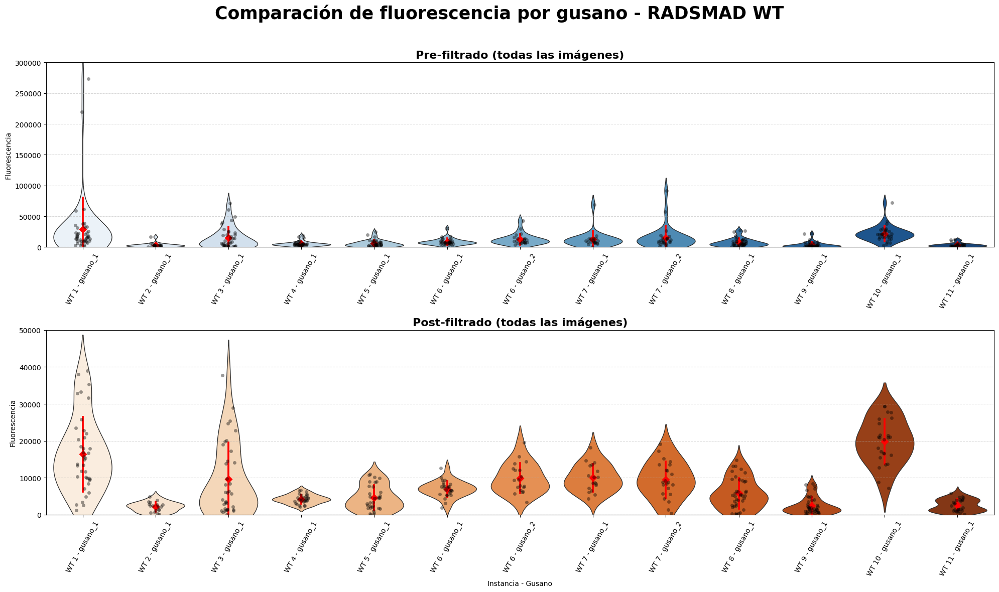

In [224]:
radsmad_wt_violin = graficar_violin_outliers_multiple(wormTrackers=wormTrackers, 
                                                    titulo="Comparación de fluorescencia por gusano - RADSMAD WT",
                                                    ylim_pre=(0, 300000), 
                                                    ylim_post=(0, 50000),
                                                    label="WT")

In [225]:
ruta_output_WT = "/home/nephelim/Documentos/Investigacion/BioPictureTools/output/WT/"

figuras_analisis_gusanos = []
for tracker in wormTrackers:
    figuras_analisis_gusanos.append(tracker.figuraGusanos)

i = 1
for figura in figuras_analisis_gusanos:
    figura.savefig(ruta_output_WT + f"RADSMAD_WT_{i}", dpi=300, bbox_inches="tight")
    i += 1

In [226]:
# Ruta base donde están los archivos
ruta_base = "/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/"

# Archivo que contiene la lista de nombres
archivo_lista = ruta_base + "nombre_imagenes_lon_2.txt"

# Leer los nombres y armar paths completos
with open(archivo_lista, "r", encoding="utf-8") as f:
    nombres_archivos = [line.strip() for line in f if line.strip()]

rutas_completas = [os.path.join(ruta_base, nombre) for nombre in nombres_archivos]


13:55:33.221 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 1.ics
13:55:33.221 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 1.ics
13:55:33.221 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 1.ics)
13:55:33.221 [main] INFO loci.formats.FormatHandler - Finding companion file
13:55:33.221 [main] INFO loci.formats.FormatHandler - Checking file version
13:55:33.229 [main] INFO loci.formats.FormatHandler - Reading metadata
13:55:33.257 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


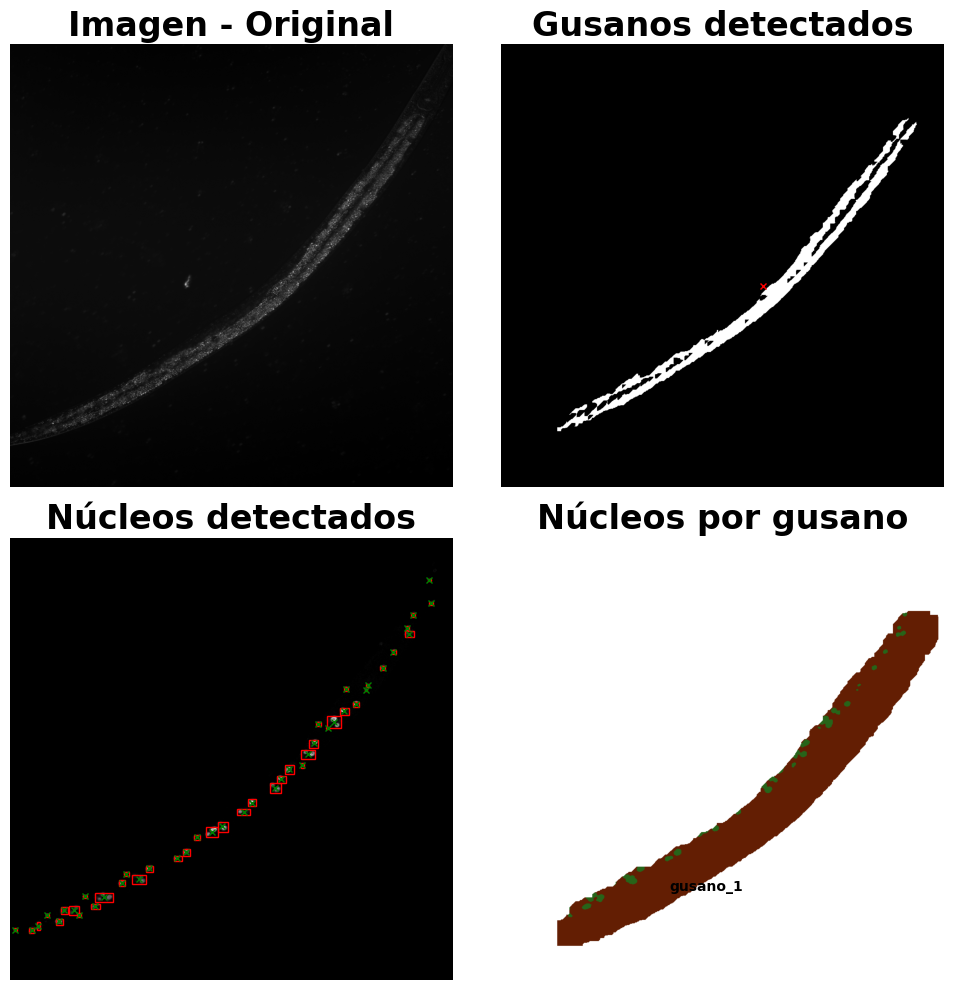

13:55:43.293 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 2.ics
13:55:43.294 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 2.ics
13:55:43.294 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 2.ics)
13:55:43.294 [main] INFO loci.formats.FormatHandler - Finding companion file
13:55:43.294 [main] INFO loci.formats.FormatHandler - Checking file version
13:55:43.302 [main] INFO loci.formats.FormatHandler - Reading metadata
13:55:43.324 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


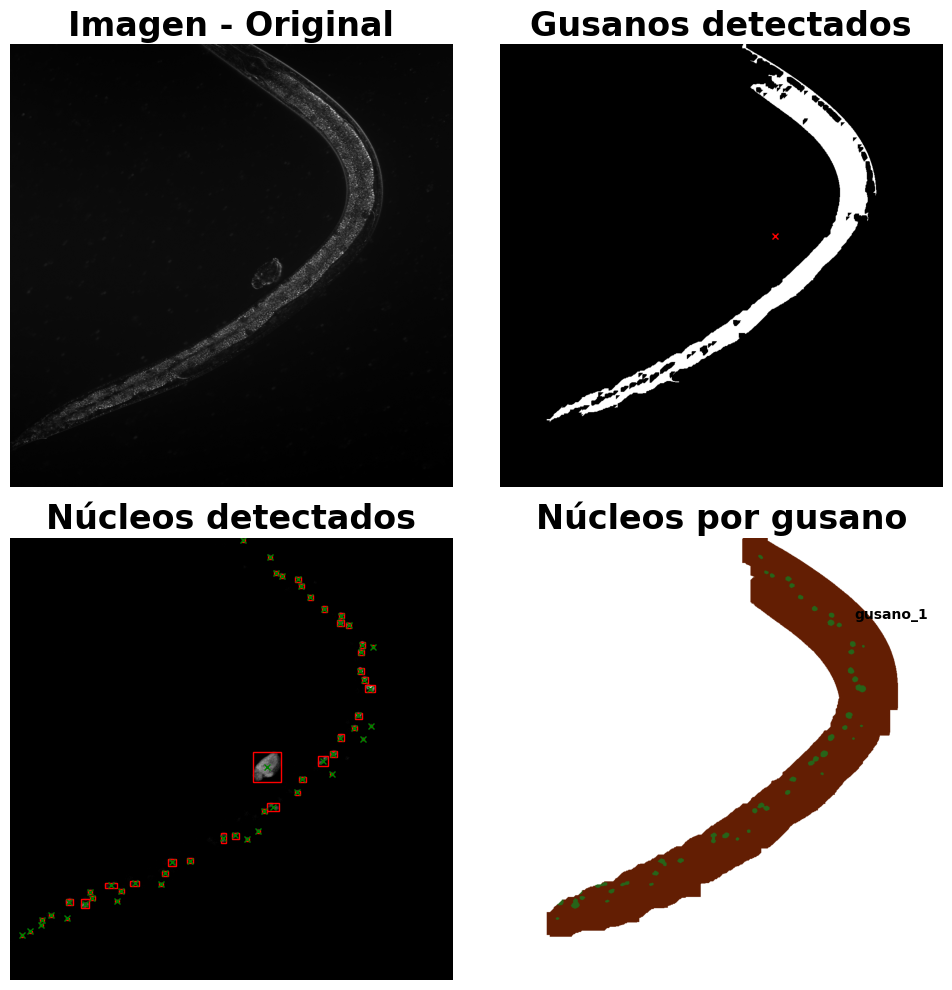

13:55:54.557 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 4.ics
13:55:54.558 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 4.ics
13:55:54.558 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 4.ics)
13:55:54.558 [main] INFO loci.formats.FormatHandler - Finding companion file
13:55:54.558 [main] INFO loci.formats.FormatHandler - Checking file version
13:55:54.560 [main] INFO loci.formats.FormatHandler - Reading metadata
13:55:54.572 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


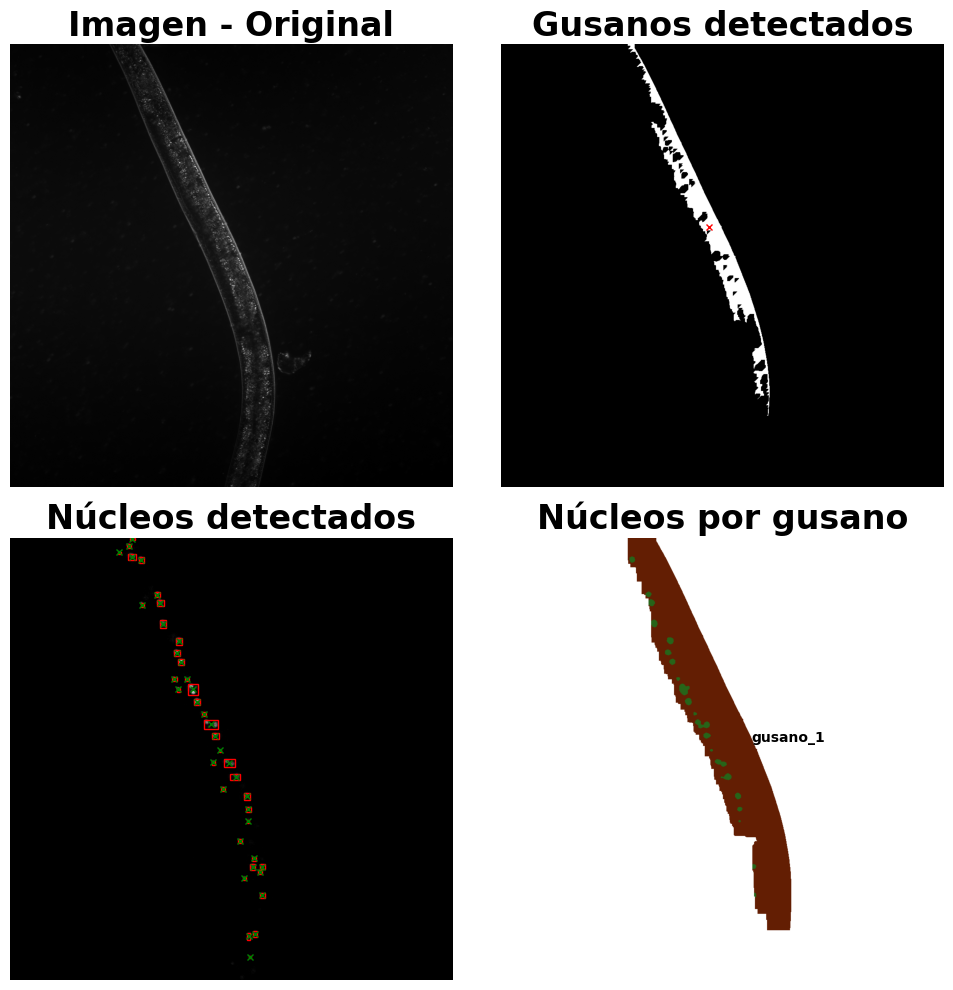

13:56:06.028 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 5.ics
13:56:06.028 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 5.ics
13:56:06.028 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 5.ics)
13:56:06.028 [main] INFO loci.formats.FormatHandler - Finding companion file
13:56:06.028 [main] INFO loci.formats.FormatHandler - Checking file version
13:56:06.030 [main] INFO loci.formats.FormatHandler - Reading metadata
13:56:06.067 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


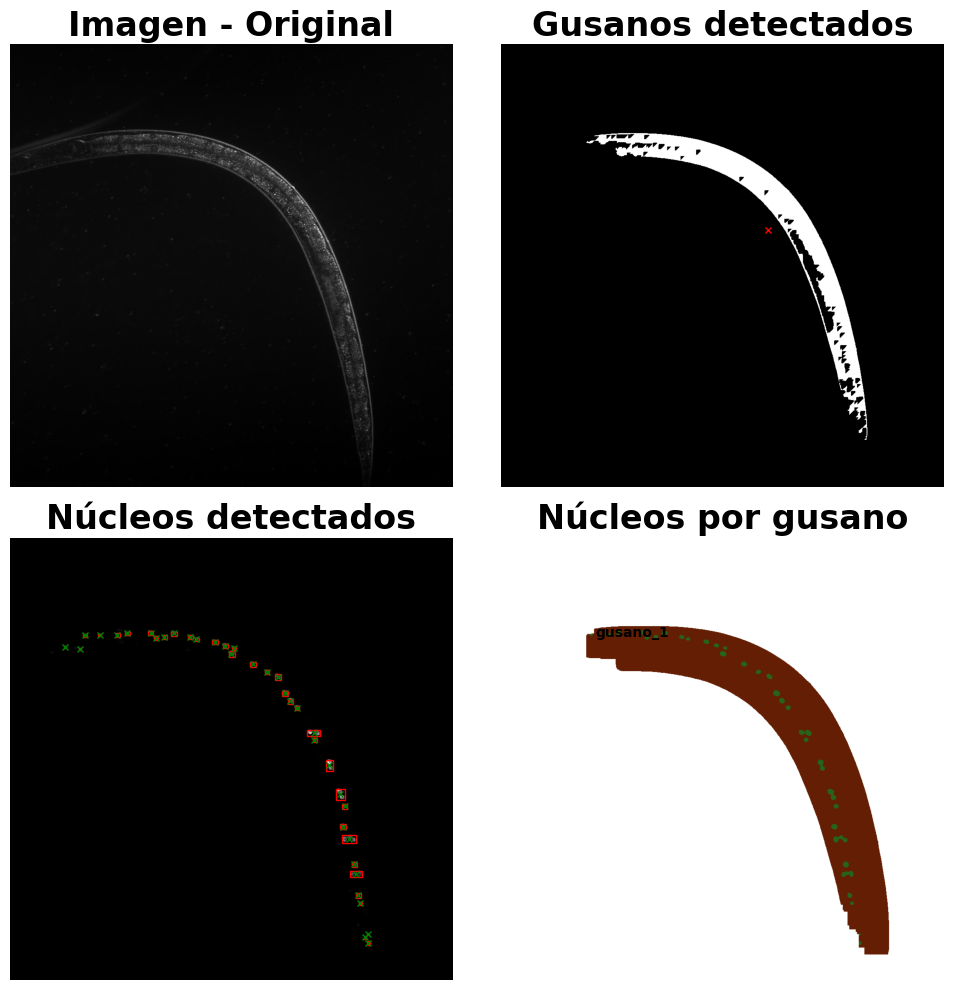

13:56:17.770 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 6.ics
13:56:17.770 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 6.ics
13:56:17.770 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 6.ics)
13:56:17.770 [main] INFO loci.formats.FormatHandler - Finding companion file
13:56:17.770 [main] INFO loci.formats.FormatHandler - Checking file version
13:56:17.797 [main] INFO loci.formats.FormatHandler - Reading metadata
13:56:17.832 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


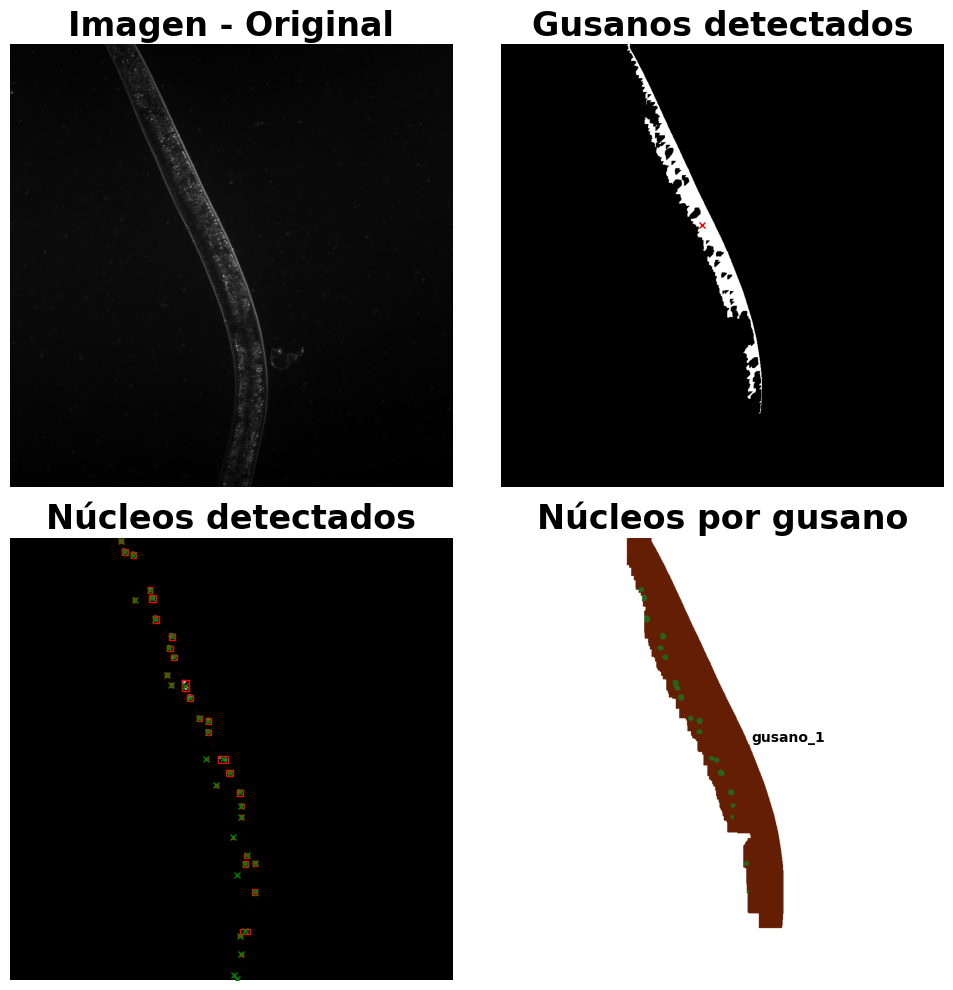

13:56:28.729 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 7.ics
13:56:28.729 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 7.ics
13:56:28.729 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 7.ics)
13:56:28.729 [main] INFO loci.formats.FormatHandler - Finding companion file
13:56:28.729 [main] INFO loci.formats.FormatHandler - Checking file version
13:56:28.770 [main] INFO loci.formats.FormatHandler - Reading metadata
13:56:28.844 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


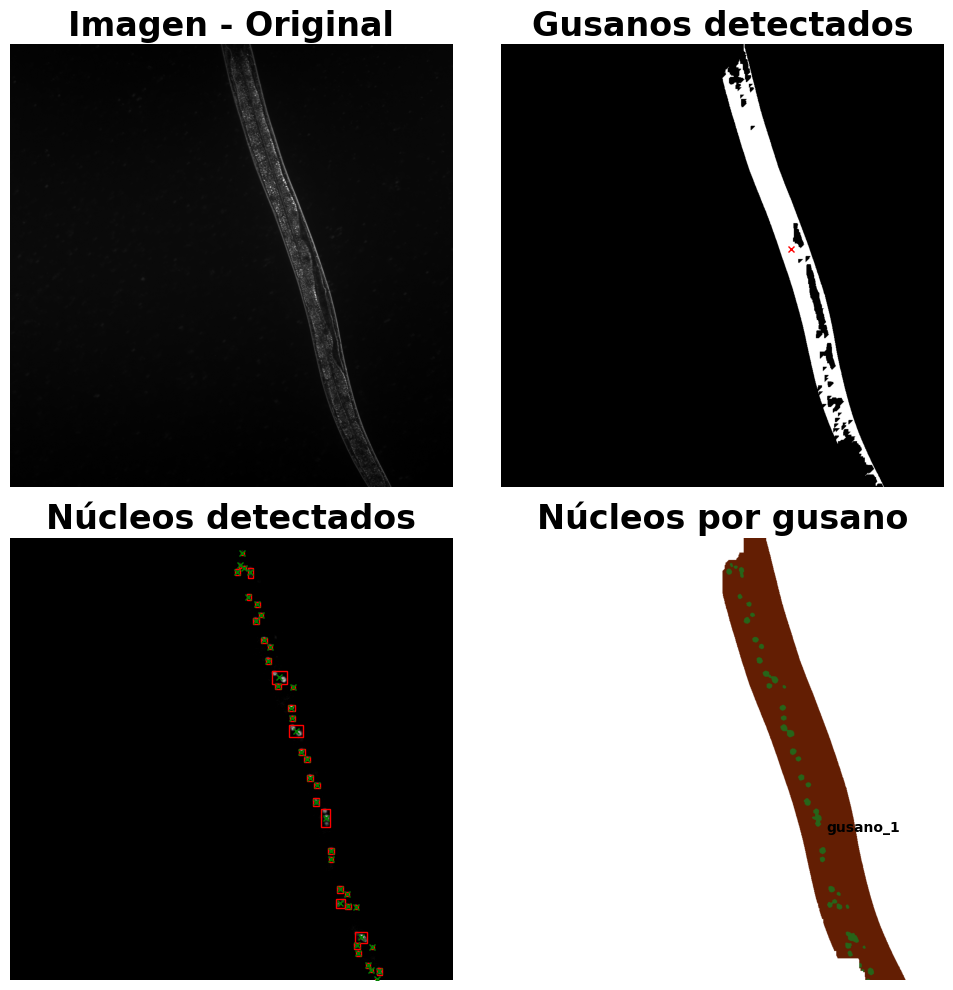

13:56:40.269 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 8.ics
13:56:40.269 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 8.ics
13:56:40.269 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 8.ics)
13:56:40.269 [main] INFO loci.formats.FormatHandler - Finding companion file
13:56:40.269 [main] INFO loci.formats.FormatHandler - Checking file version
13:56:40.293 [main] INFO loci.formats.FormatHandler - Reading metadata
13:56:40.330 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


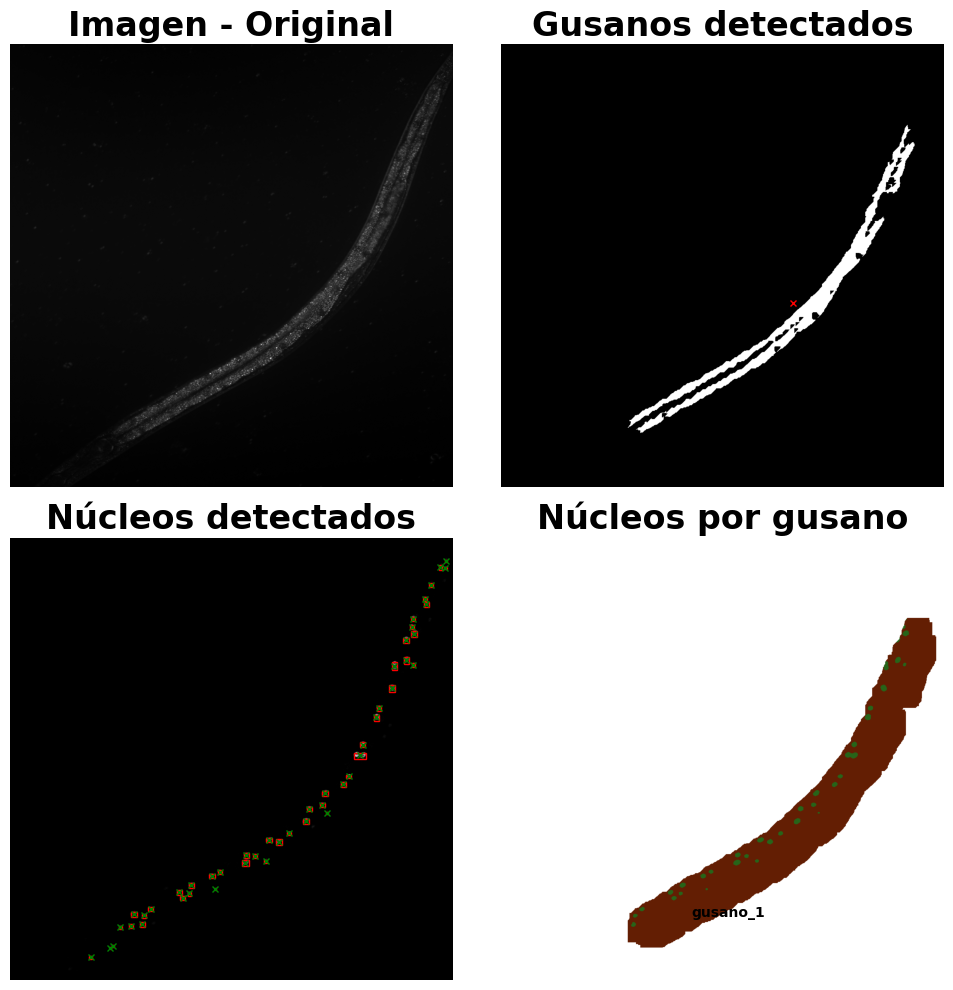

13:56:51.716 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 9.ics
13:56:51.716 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 9.ics
13:56:51.717 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 9.ics)
13:56:51.717 [main] INFO loci.formats.FormatHandler - Finding companion file
13:56:51.717 [main] INFO loci.formats.FormatHandler - Checking file version
13:56:51.742 [main] INFO loci.formats.FormatHandler - Reading metadata
13:56:51.811 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.bas

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


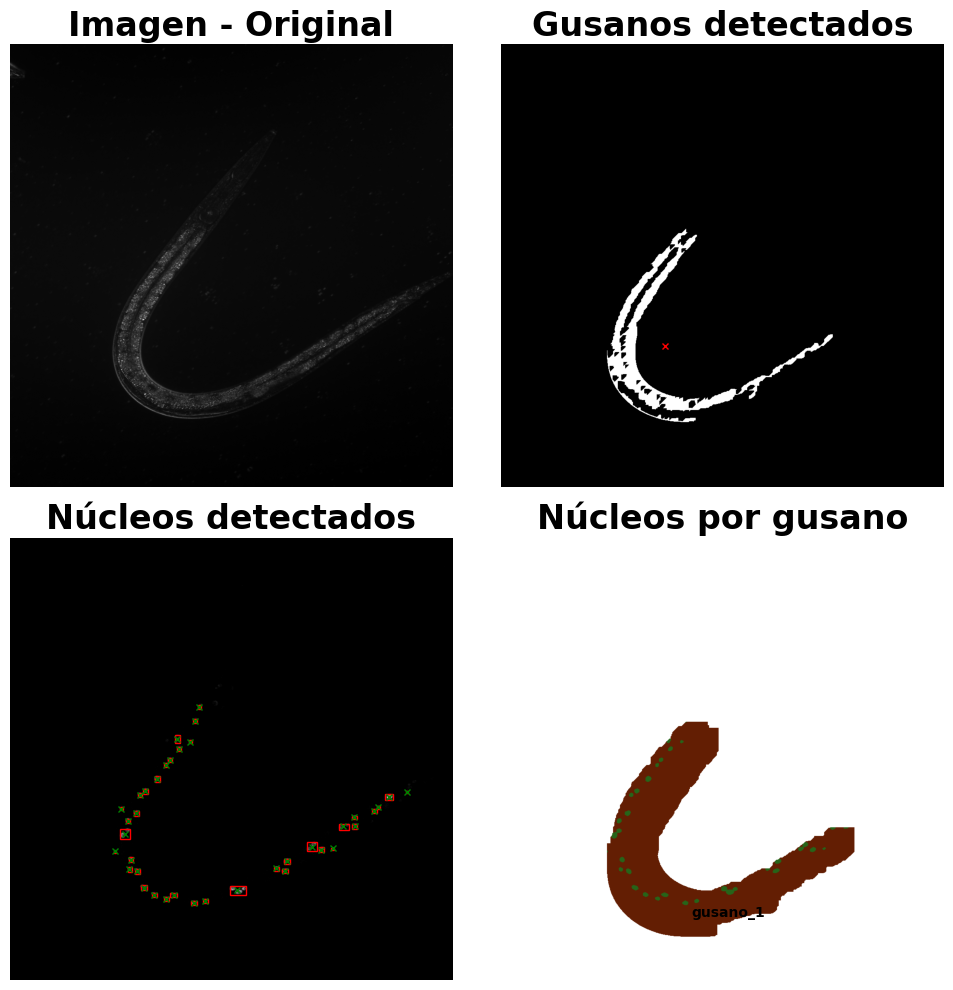

13:57:04.279 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 10.ics
13:57:04.279 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 10.ics
13:57:04.279 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 10.ics)
13:57:04.279 [main] INFO loci.formats.FormatHandler - Finding companion file
13:57:04.279 [main] INFO loci.formats.FormatHandler - Checking file version
13:57:04.300 [main] INFO loci.formats.FormatHandler - Reading metadata
13:57:04.316 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


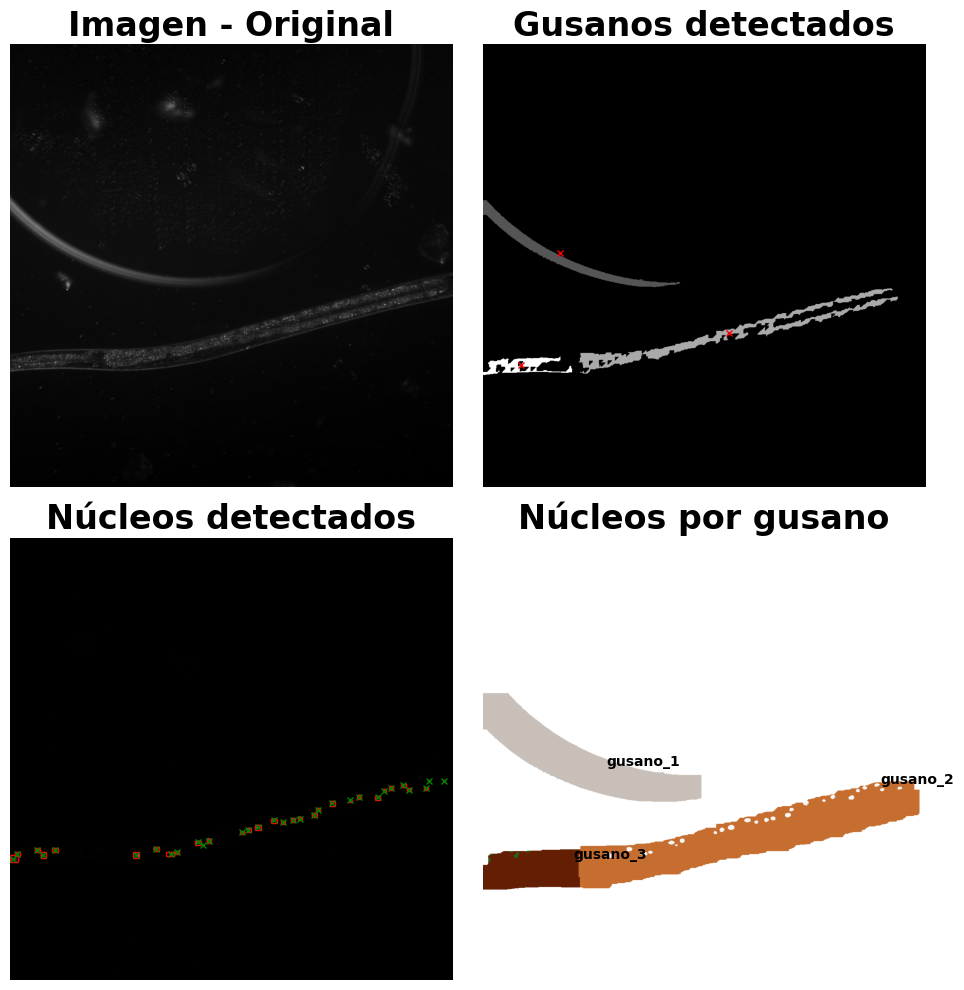

13:57:16.802 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 11.ics
13:57:16.802 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 11.ics
13:57:16.803 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/lon-2 11.ics)
13:57:16.803 [main] INFO loci.formats.FormatHandler - Finding companion file
13:57:16.803 [main] INFO loci.formats.FormatHandler - Checking file version
13:57:16.825 [main] INFO loci.formats.FormatHandler - Reading metadata
13:57:16.862 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


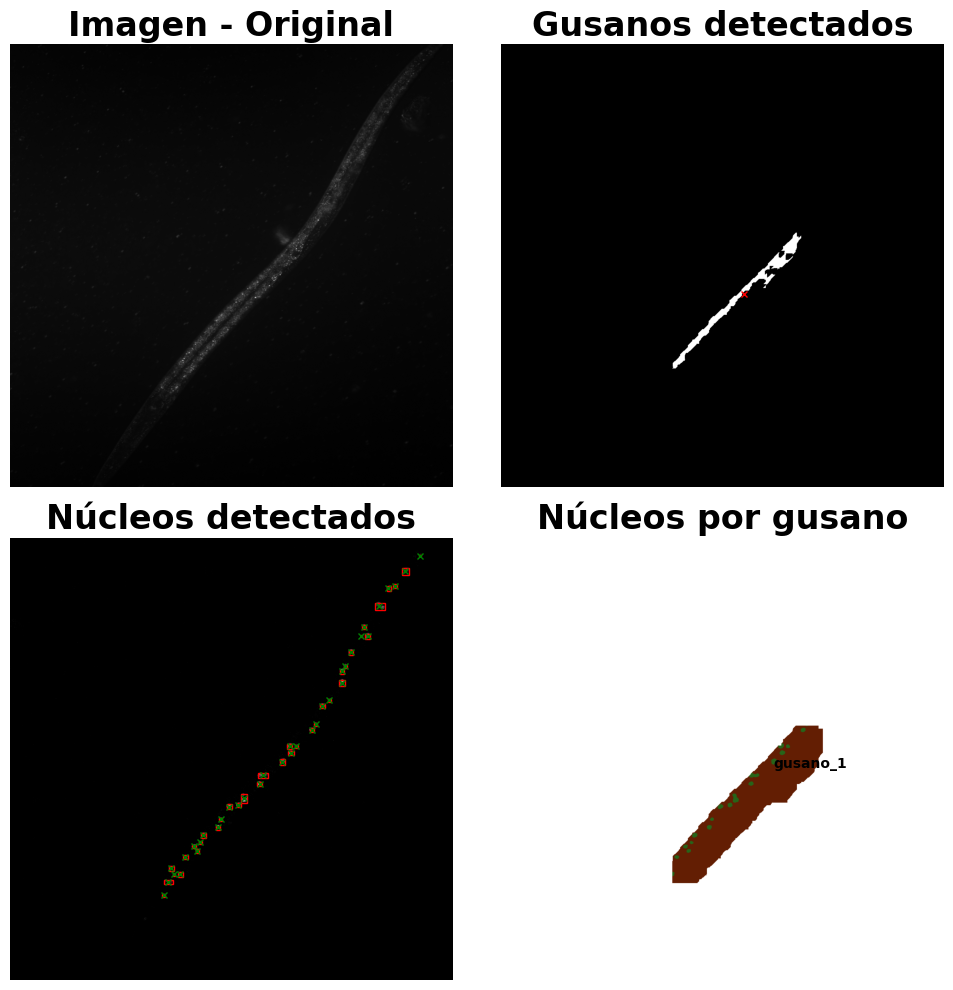

In [14]:
wormTrackers_lon_2 = []
for ruta in rutas_completas:
    wormTrackers_lon_2.append(WormTracker(ruta))
estadisticas_fluorescencias_lon_2 = []
for tracker in wormTrackers_lon_2:
    tracker.procesarImagen(thresholdCampoClaro=0.20, thresholdFluo=0.05) # Cambio a menor threshold
    tracker.buscarNucleos(tol_cerrada = 4, tol_abierta = 5) # cambio tol cerrada
    tracker.coordenadasDeNucleos()
    tracker.centroidesDeNucleos()
    tracker.buscarGusanos(tol_cerrada_1=2, tol_cerrada_2=2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=2, tol_rellenado_2=2, max_iteracion=10) 
    tracker.coordenadasDeGusanos()
    tracker.interseccionGusanoNucleos()
    tracker.graficarProcesamiento(modos=[0, 1, 3, 4])
    tracker.fluorescencia_de_nucleos()
    _, _, estadisticas = tracker.eliminar_outliers()
    estadisticas_fluorescencias.append(estadisticas)

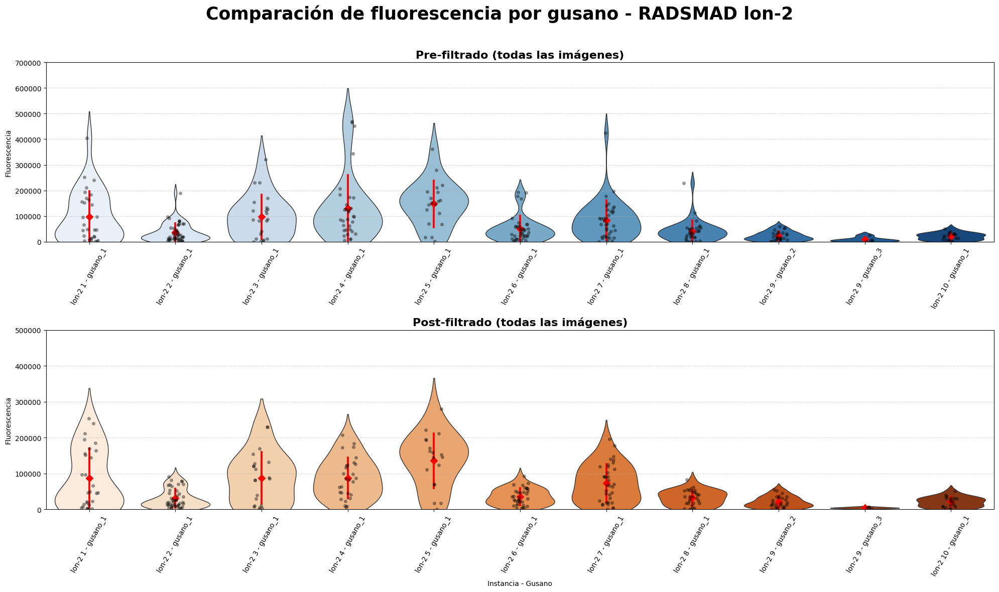

In [16]:
radsmad_lon_2_violin = graficar_violin_outliers_multiple(wormTrackers=wormTrackers_lon_2, 
                                                    titulo="Comparación de fluorescencia por gusano - RADSMAD lon-2",
                                                    ylim_pre=(0, 700000), 
                                                    ylim_post=(0,500000),
                                                    label="lon-2")

In [238]:
ruta_output_lon_2 = "/home/nephelim/Documentos/Investigacion/BioPictureTools/output/lon_2/"

figuras_analisis_gusanos_lon_2 = []
for tracker in wormTrackers_lon_2:
    figuras_analisis_gusanos_lon_2.append(tracker.figuraGusanos)

i = 1
for figura in figuras_analisis_gusanos_lon_2:
    figura.savefig(ruta_output_lon_2 + f"RADSMAD_lon_2_{i}", dpi=300, bbox_inches="tight")
    i += 1

In [18]:
# Ruta base donde están los archivos
ruta_base = "/home/nephelim/Descargas/Radsmad_C_elegans_2_10/"

# Archivo que contiene la lista de nombres
archivo_lista = ruta_base + "nombre_archivo_ztf_30.txt"

# Leer los nombres y armar paths completos
with open(archivo_lista, "r", encoding="utf-8") as f:
    nombres_archivos = [line.strip() for line in f if line.strip()]

rutas_completas = [os.path.join(ruta_base, nombre) for nombre in nombres_archivos]

14:05:58.334 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 1.ics
14:05:58.334 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 1.ics
14:05:58.334 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 1.ics)
14:05:58.334 [main] INFO loci.formats.FormatHandler - Finding companion file
14:05:58.334 [main] INFO loci.formats.FormatHandler - Checking file version
14:05:58.336 [main] INFO loci.formats.FormatHandler - Reading metadata
14:05:58.350 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


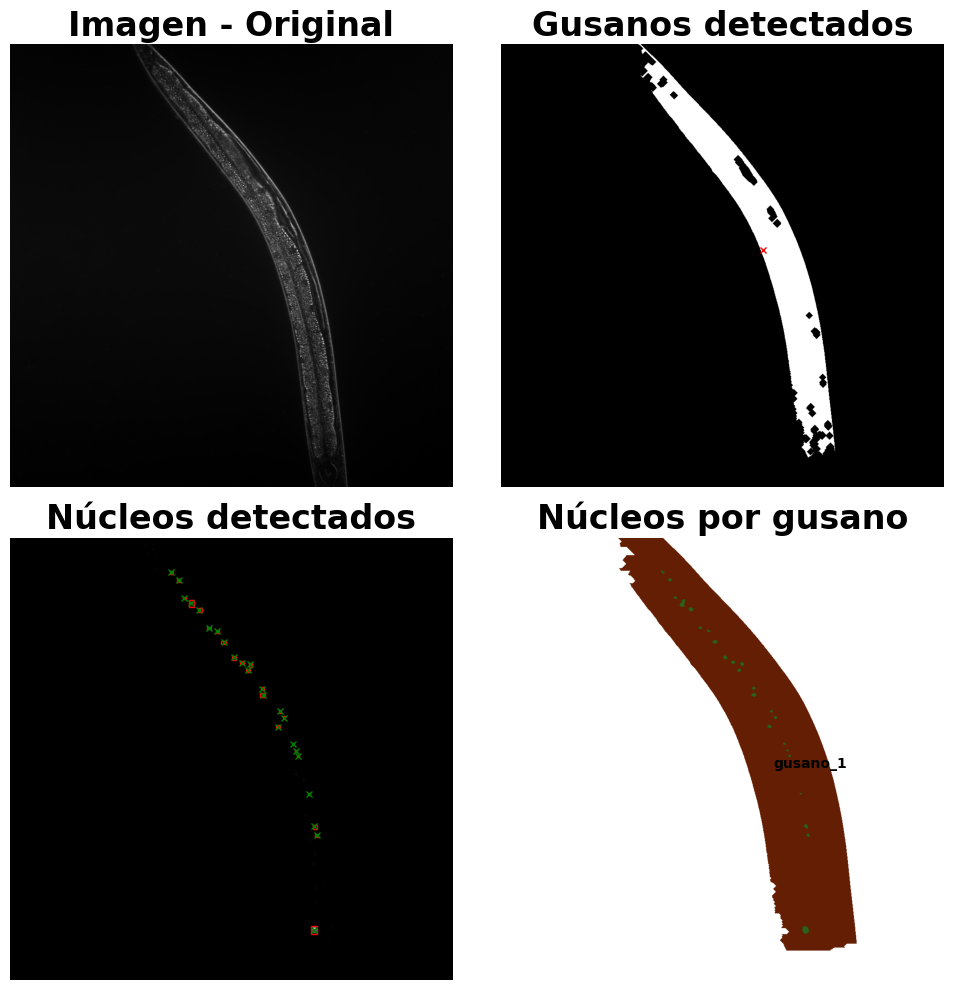

14:06:14.748 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 2.ics
14:06:14.749 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 2.ics
14:06:14.749 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 2.ics)
14:06:14.749 [main] INFO loci.formats.FormatHandler - Finding companion file
14:06:14.749 [main] INFO loci.formats.FormatHandler - Checking file version
14:06:14.750 [main] INFO loci.formats.FormatHandler - Reading metadata
14:06:14.841 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


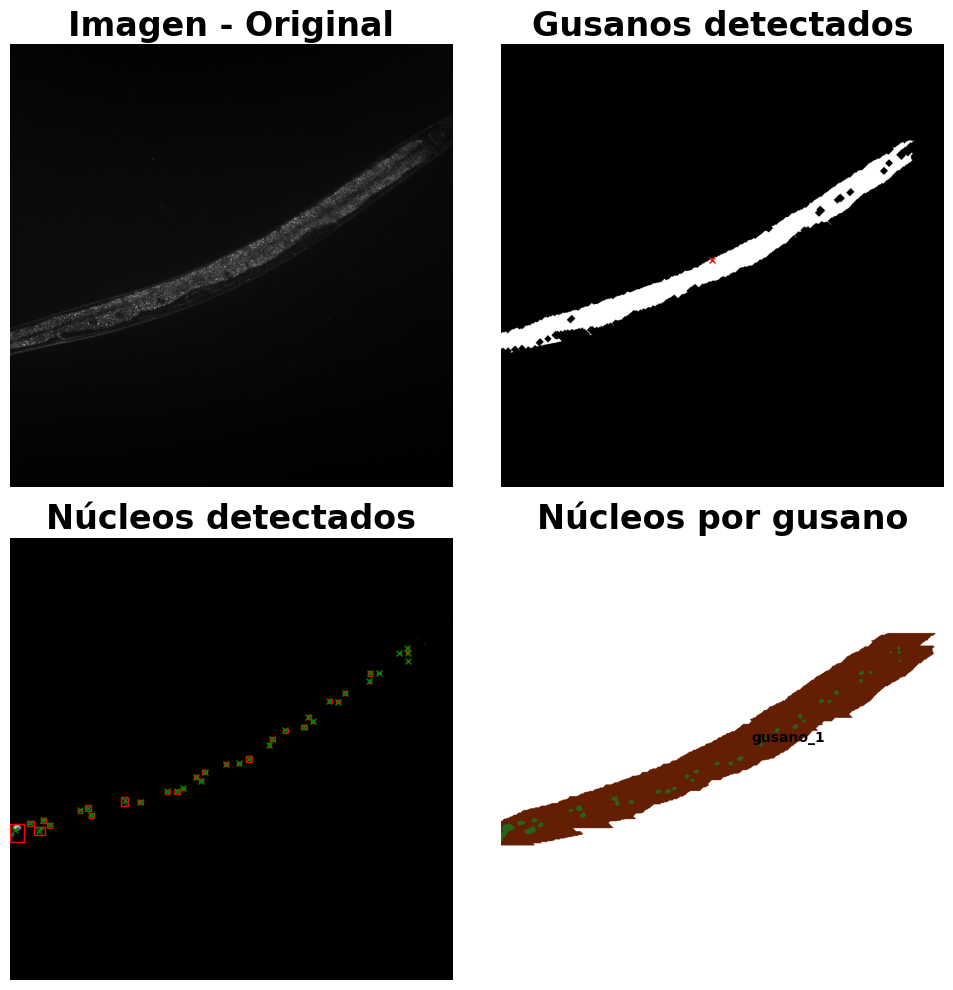

14:06:39.532 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 3.ics
14:06:39.532 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 3.ics
14:06:39.532 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 3.ics)
14:06:39.532 [main] INFO loci.formats.FormatHandler - Finding companion file
14:06:39.532 [main] INFO loci.formats.FormatHandler - Checking file version
14:06:39.534 [main] INFO loci.formats.FormatHandler - Reading metadata
14:06:39.577 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


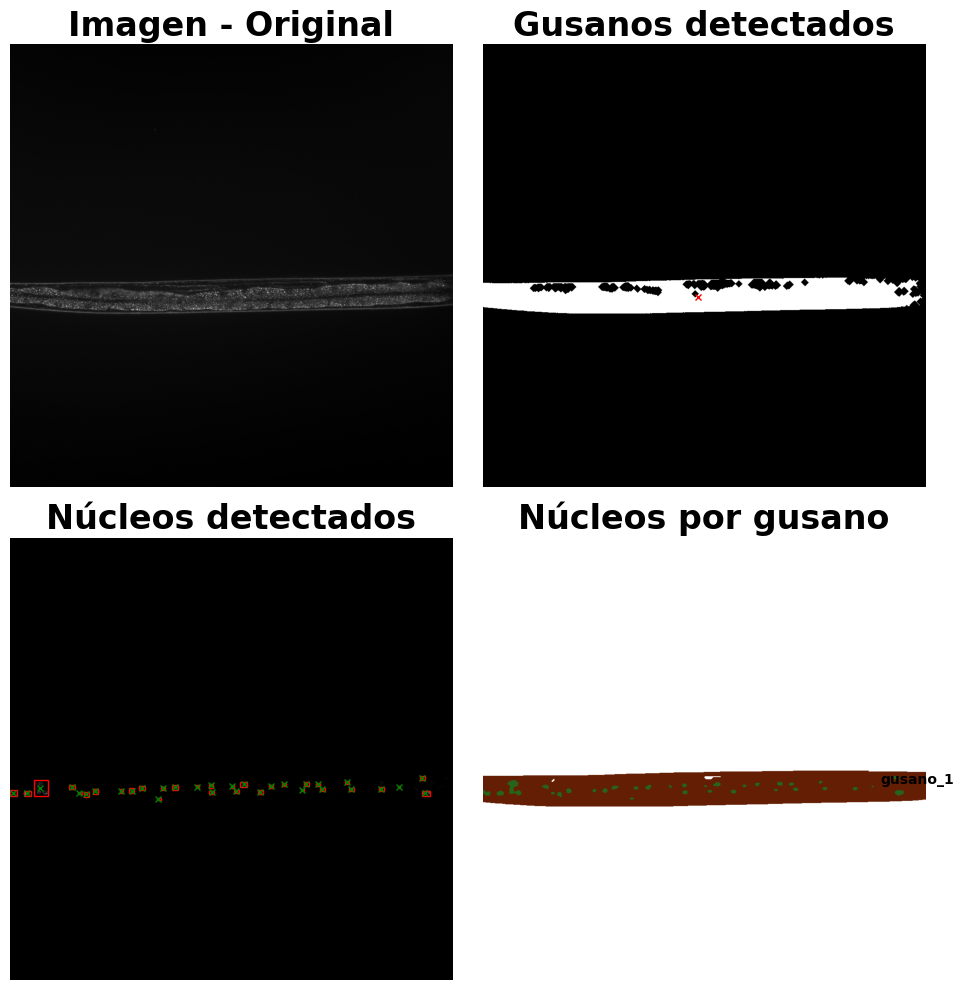

14:06:56.866 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 4.ics
14:06:56.866 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 4.ics
14:06:56.866 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 4.ics)
14:06:56.866 [main] INFO loci.formats.FormatHandler - Finding companion file
14:06:56.866 [main] INFO loci.formats.FormatHandler - Checking file version
14:06:56.885 [main] INFO loci.formats.FormatHandler - Reading metadata
14:06:56.912 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


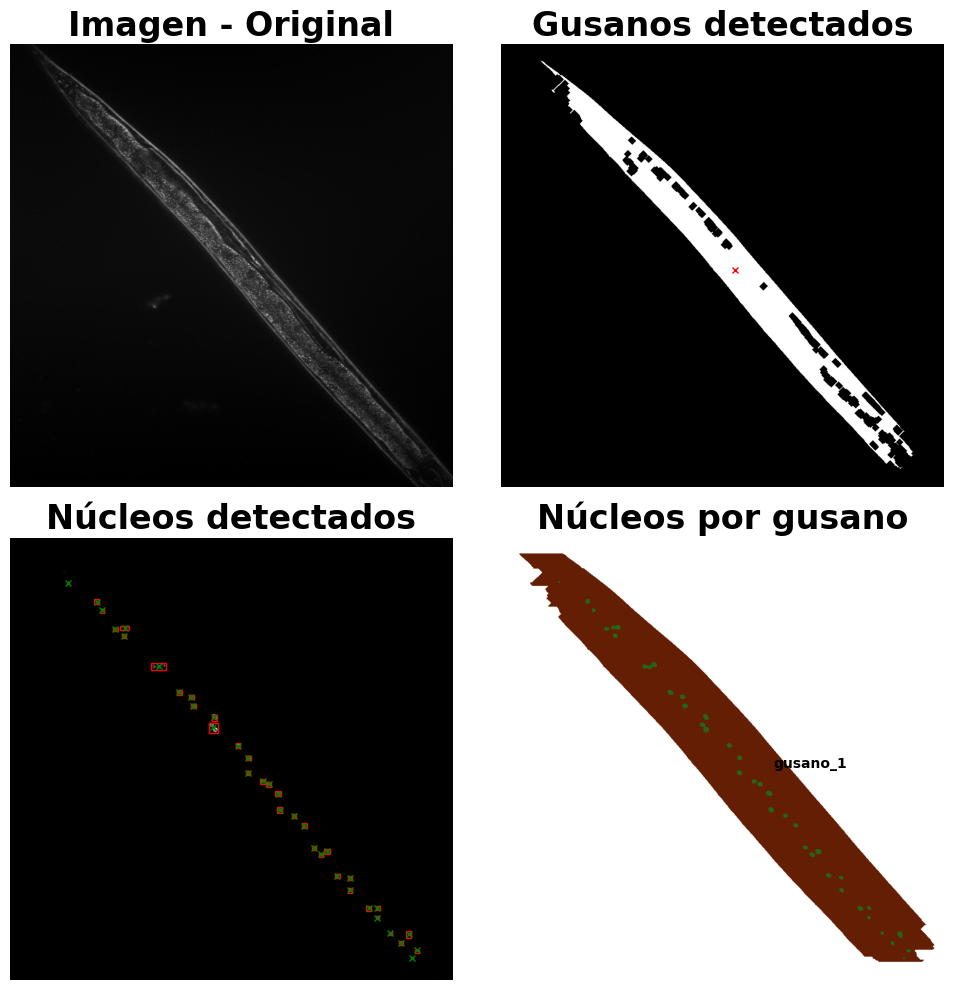

14:07:19.621 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 5.ics
14:07:19.621 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 5.ics
14:07:19.621 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans_2_10/ztf-30 5.ics)
14:07:19.621 [main] INFO loci.formats.FormatHandler - Finding companion file
14:07:19.621 [main] INFO loci.formats.FormatHandler - Checking file version
14:07:19.645 [main] INFO loci.formats.FormatHandler - Reading metadata
14:07:19.661 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.FloatingDecimal.parseDouble(Unknown Source)
	at java.

/tmp/ipykernel_1260/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


In [ ]:
wormTrackers_ztf_30 = []
for ruta in rutas_completas:
    wormTrackers_ztf_30.append(WormTracker(ruta))
estadisticas_fluorescencias_ztf_30 = []
for tracker in wormTrackers_ztf_30:
    tracker.procesarImagen(thresholdCampoClaro=0.22, thresholdFluo=0.05) # Cambio a menor threshold
    tracker.buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
    tracker.coordenadasDeNucleos()
    tracker.centroidesDeNucleos()
    tracker.buscarGusanos(tol_cerrada_1 = 3, tol_cerrada_2 = 3, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=3, tol_rellenado_2=1, max_iteracion=10) 
    tracker.coordenadasDeGusanos()
    tracker.interseccionGusanoNucleos()
    tracker.graficarProcesamiento(modos=[0, 1, 3, 4])
    tracker.fluorescencia_de_nucleos()
    _, _, estadisticas = tracker.eliminar_outliers()
    estadisticas_fluorescencias_ztf_30.append(estadisticas)

05:45:09.276 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids
05:45:09.276 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids
05:45:09.276 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids)
05:45:09.326 [main] INFO loci.formats.FormatHandler - Finding companion file
05:45:09.326 [main] INFO loci.formats.FormatHandler - Checking file version
05:45:09.329 [main] INFO loci.formats.FormatHandler - Reading metadata
05:45:09.400 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_448/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


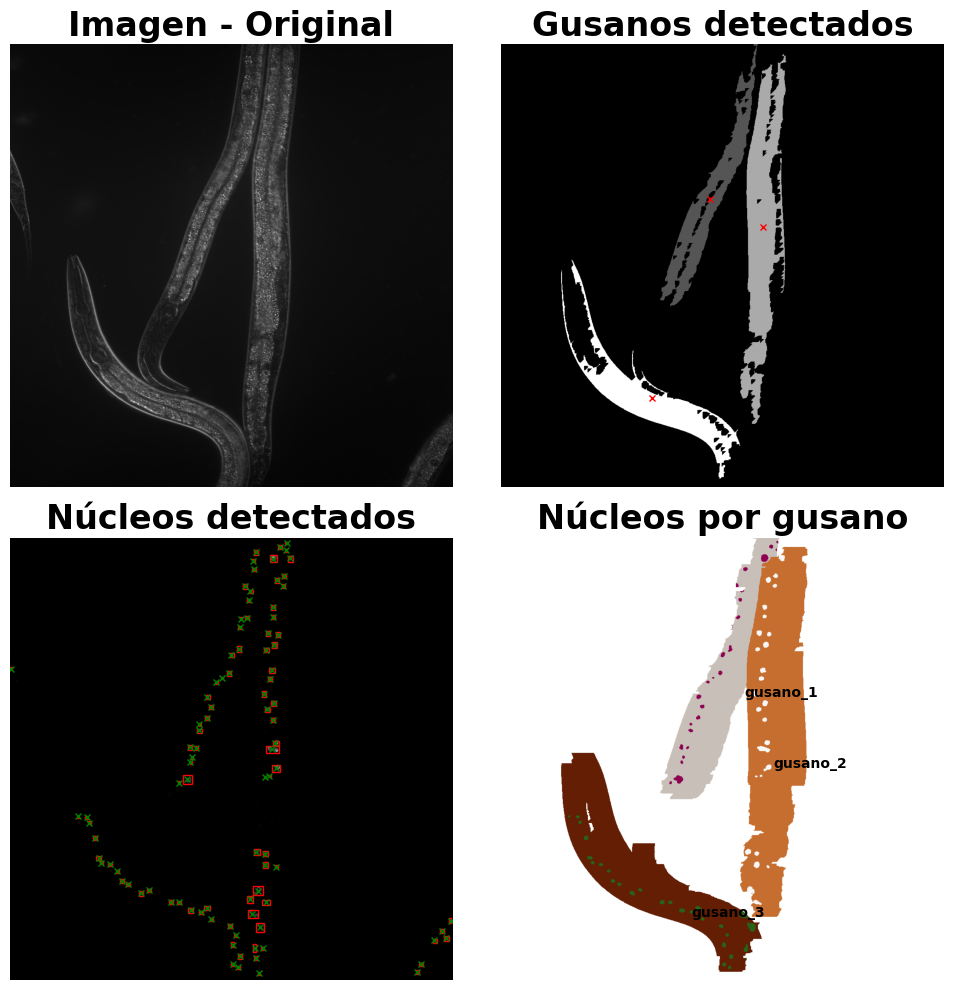

In [253]:
wormTrackers_ztf_30[2].procesarImagen(thresholdCampoClaro=0.25, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[2].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[2].coordenadasDeNucleos()
wormTrackers_ztf_30[2].centroidesDeNucleos()
wormTrackers_ztf_30[2].buscarGusanos(tol_cerrada_1 = 1, tol_cerrada_2 = 2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=1000, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[2].coordenadasDeGusanos()
wormTrackers_ztf_30[2].interseccionGusanoNucleos()
wormTrackers_ztf_30[2].graficarProcesamiento(modos=[0, 1, 3, 4])
wormTrackers_ztf_30[2].fluorescencia_de_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[2].eliminar_outliers()
estadisticas_fluorescencias_ztf_30[2] = estadisticas

05:52:26.590 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids
05:52:26.590 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids
05:52:26.590 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids)
05:52:26.590 [main] INFO loci.formats.FormatHandler - Finding companion file
05:52:26.590 [main] INFO loci.formats.FormatHandler - Checking file version
05:52:26.591 [main] INFO loci.formats.FormatHandler - Reading metadata
05:52:26.607 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_448/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


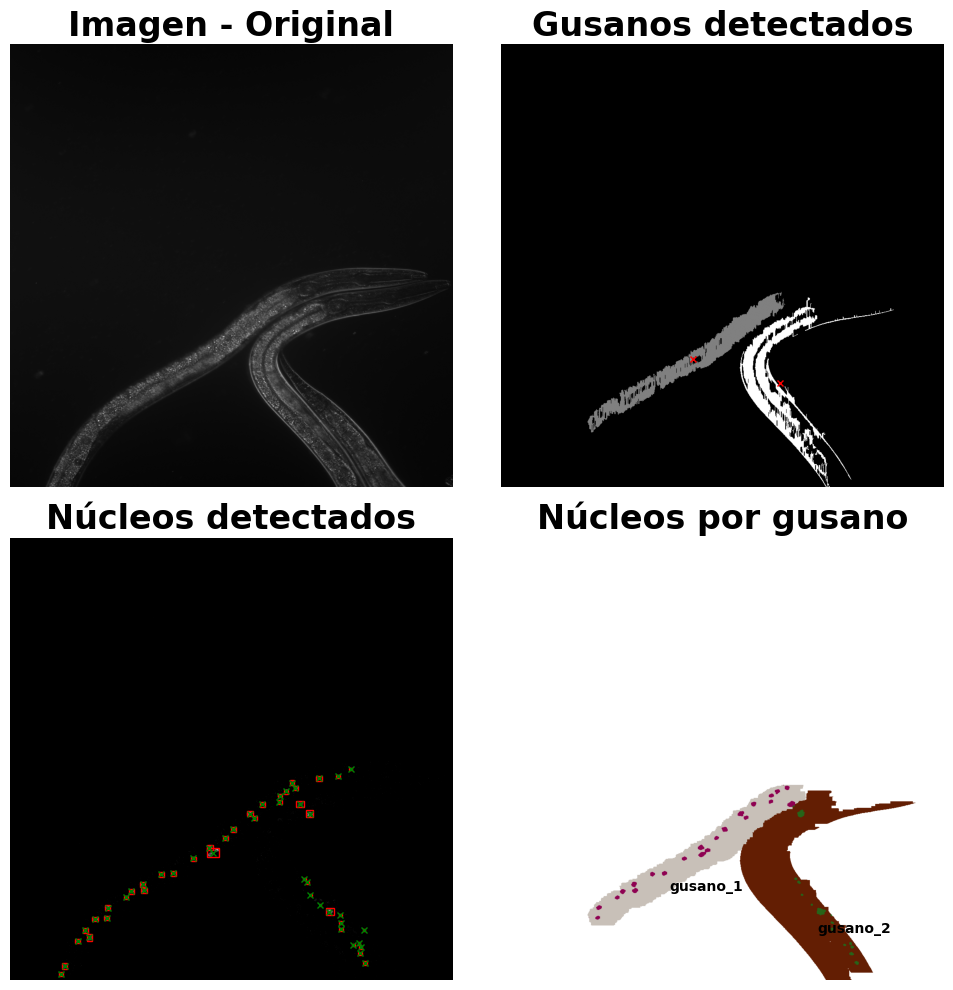

In [256]:
wormTrackers_ztf_30[3].procesarImagen(thresholdCampoClaro=0.25, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[3].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[3].coordenadasDeNucleos()
wormTrackers_ztf_30[3].centroidesDeNucleos()
wormTrackers_ztf_30[3].buscarGusanos(tol_cerrada_1 = 1, tol_cerrada_2 = 2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=2500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[3].coordenadasDeGusanos()
wormTrackers_ztf_30[3].interseccionGusanoNucleos()
wormTrackers_ztf_30[3].graficarProcesamiento(modos=[0, 1, 3, 4])
wormTrackers_ztf_30[3].fluorescencia_de_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[3].eliminar_outliers()
estadisticas_fluorescencias_ztf_30[3] = estadisticas

06:01:10.888 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids
06:01:10.888 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids
06:01:10.888 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids)
06:01:10.888 [main] INFO loci.formats.FormatHandler - Finding companion file
06:01:10.888 [main] INFO loci.formats.FormatHandler - Checking file version
06:01:10.889 [main] INFO loci.formats.FormatHandler - Reading metadata
06:01:10.936 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_448/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


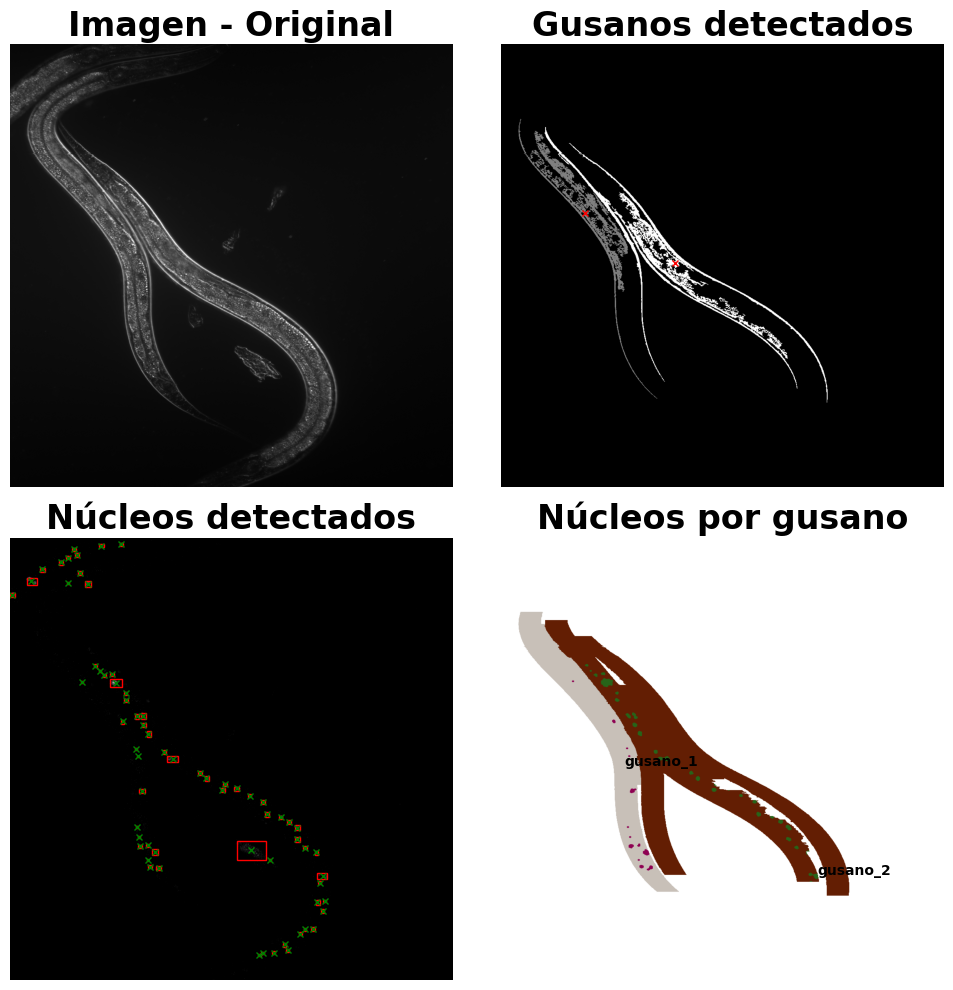

In [263]:
wormTrackers_ztf_30[4].procesarImagen(thresholdCampoClaro=0.32, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[4].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[4].coordenadasDeNucleos()
wormTrackers_ztf_30[4].centroidesDeNucleos()
wormTrackers_ztf_30[4].buscarGusanos(tol_cerrada_1 = 2, tol_cerrada_2=1, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[4].coordenadasDeGusanos()
wormTrackers_ztf_30[4].interseccionGusanoNucleos()
wormTrackers_ztf_30[4].graficarProcesamiento(modos=[0, 1, 3, 4])
wormTrackers_ztf_30[4].fluorescencia_de_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[4].eliminar_outliers()
estadisticas_fluorescencias_ztf_30[4] = estadisticas

05:32:48.244 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids
05:32:48.245 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids
05:32:48.245 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids)
05:32:48.245 [main] INFO loci.formats.FormatHandler - Finding companion file
05:32:48.245 [main] INFO loci.formats.FormatHandler - Checking file version
05:32:48.249 [main] INFO loci.formats.FormatHandler - Reading metadata
05:32:48.359 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_448/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


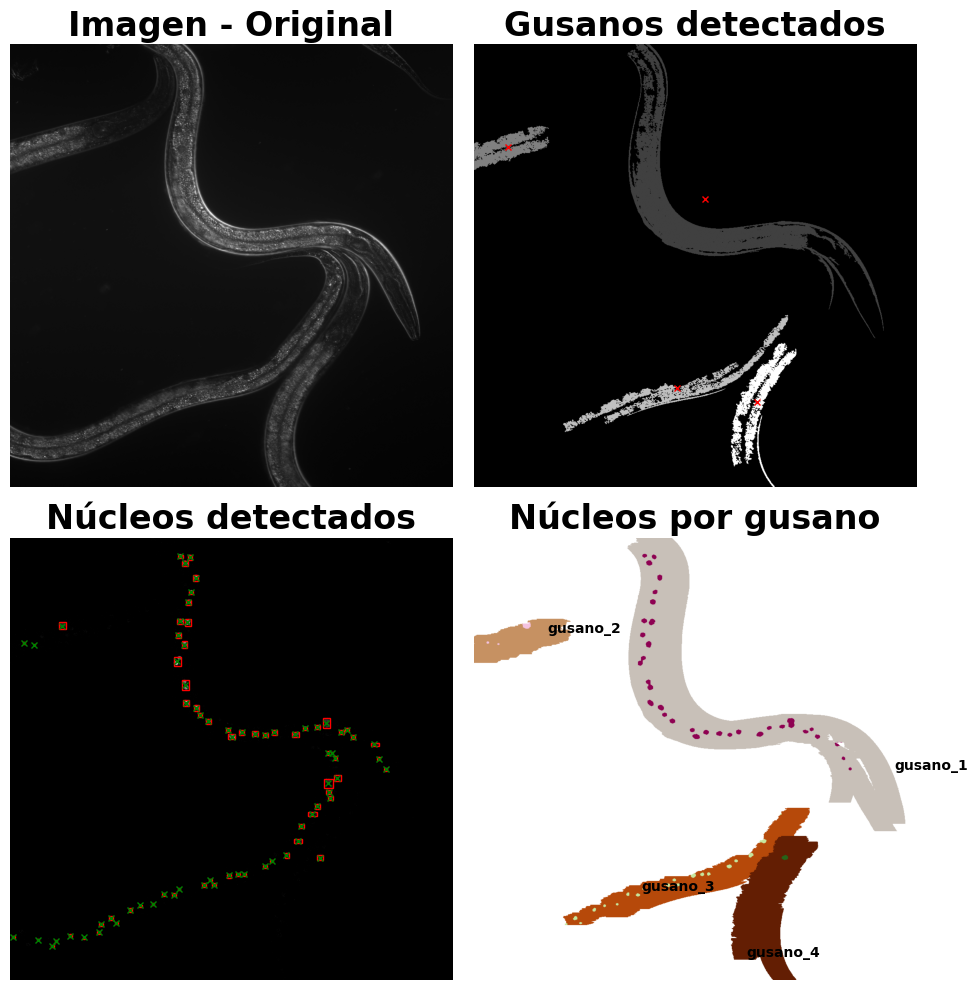

In [247]:
wormTrackers_ztf_30[8].procesarImagen(thresholdCampoClaro=0.20, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[8].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[8].coordenadasDeNucleos()
wormTrackers_ztf_30[8].centroidesDeNucleos()
wormTrackers_ztf_30[8].buscarGusanos(iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[8].coordenadasDeGusanos()
wormTrackers_ztf_30[8].interseccionGusanoNucleos()
wormTrackers_ztf_30[8].graficarProcesamiento(modos=[0, 1, 3, 4])
wormTrackers_ztf_30[8].fluorescencia_de_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[8].eliminar_outliers()
estadisticas_fluorescencias_ztf_30[8] = estadisticas

05:39:48.239 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids
05:39:48.239 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids
05:39:48.239 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids)
05:39:48.239 [main] INFO loci.formats.FormatHandler - Finding companion file
05:39:48.240 [main] INFO loci.formats.FormatHandler - Checking file version
05:39:48.242 [main] INFO loci.formats.FormatHandler - Reading metadata
05:39:48.399 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_448/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


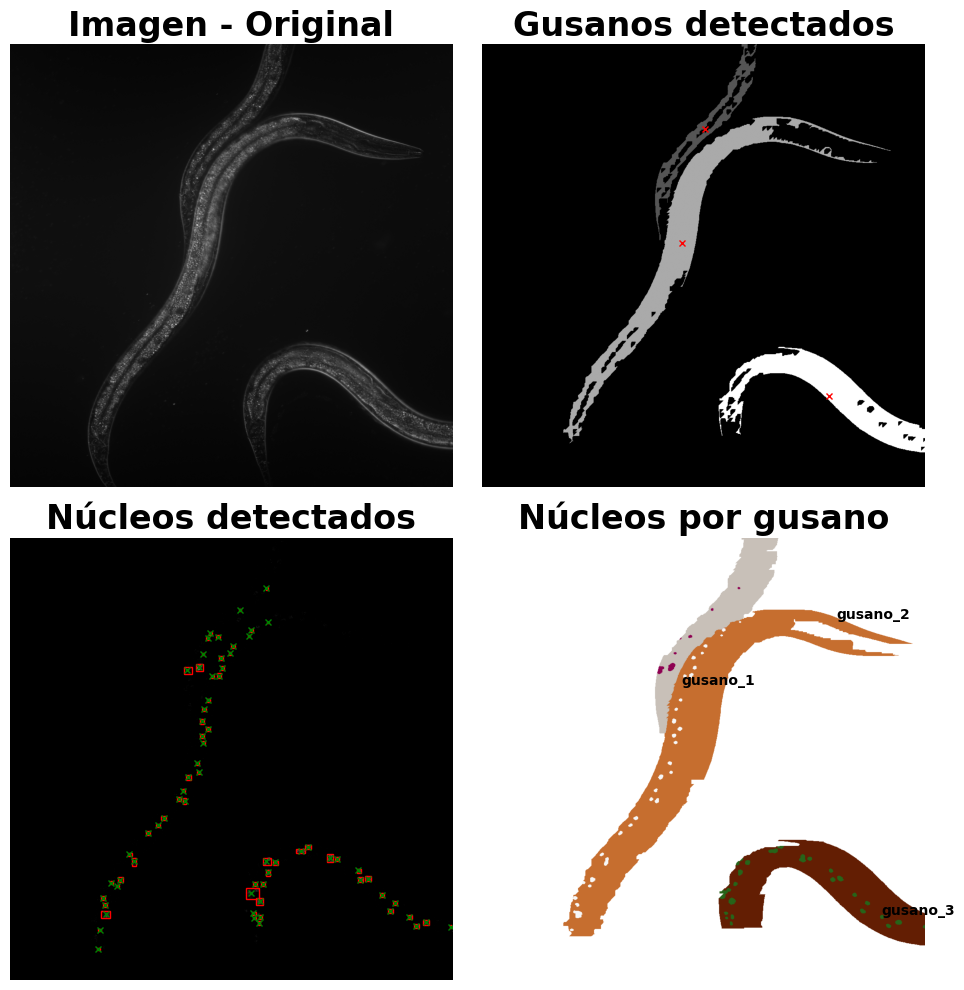

In [251]:
wormTrackers_ztf_30[6].procesarImagen(thresholdCampoClaro=0.20, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[6].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[6].coordenadasDeNucleos()
wormTrackers_ztf_30[6].centroidesDeNucleos()
wormTrackers_ztf_30[6].buscarGusanos(tol_cerrada_1 = 2, tol_cerrada_2 = 2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=1000, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[6].coordenadasDeGusanos()
wormTrackers_ztf_30[6].interseccionGusanoNucleos()
wormTrackers_ztf_30[6].graficarProcesamiento(modos=[0, 1, 3, 4])
wormTrackers_ztf_30[6].fluorescencia_de_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[6].eliminar_outliers()
estadisticas_fluorescencias_ztf_30[6] = estadisticas

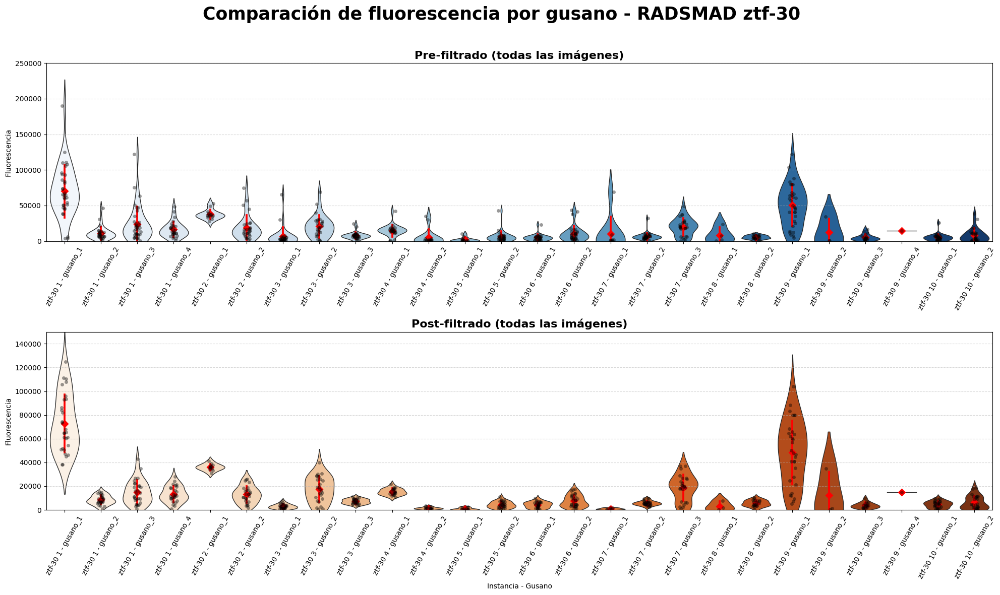

In [266]:
radsmad_ztf_30_violin = graficar_violin_outliers_multiple(wormTrackers=wormTrackers_ztf_30, 
                                                    titulo="Comparación de fluorescencia por gusano - RADSMAD ztf-30",
                                                    ylim_pre=(0, 250000), 
                                                    ylim_post=(0,150000),
                                                    label="ztf-30")

In [267]:
ruta_output_ztf_30 = "/home/nephelim/Documentos/Investigacion/BioPictureTools/output/ztf_30/"

figuras_analisis_gusanos_ztf_30 = []
for tracker in wormTrackers_ztf_30:
    figuras_analisis_gusanos_ztf_30.append(tracker.figuraGusanos)

i = 1
for figura in figuras_analisis_gusanos_ztf_30:
    figura.savefig(ruta_output_ztf_30 + f"RADSMAD_ztf_30_{i}", dpi=300, bbox_inches="tight")
    i += 1

In [268]:
def raincloud_plot(wormTrackers_dict, post=False, titulo="Distribución de fluorescencia por condición"):
    """
    Genera un raincloud plot comparando condiciones (WT, ztf-30, lon-2).
    
    Parameters
    ----------
    wormTrackers_dict : dict
        Diccionario con etiquetas como keys (e.g., {"WT": lista_wt, "ztf-30": lista_ztf, "lon-2": lista_lon})
        y listas de instancias WormTracker como valores.
    post : bool
        Si True, usa fluorescencias post-filtrado (fluorescenciasPorGusanoCorregido).
    titulo : str
        Título del gráfico.
    """
    
    # ---- Preparar datos en formato tidy ----
    data = []
    for label, trackers in wormTrackers_dict.items():
        for idx, tracker in enumerate(trackers):
            dicc = tracker.fluorescenciasPorGusanoCorregido if post else tracker.fluorescenciasPorGusano
            instancia = getattr(tracker, "nombre", f"{label} {idx+1}")
            for gusano, nucleos in dicc.items():
                for _, val in nucleos.items():
                    data.append({
                        "Condición": label,
                        "Gusano": f"{instancia}-{gusano}",
                        "Fluorescencia": val
                    })

    import pandas as pd
    df = pd.DataFrame(data)

    # ---- Plot ----
    plt.figure(figsize=(10,6))
    sns.violinplot(data=df, x="Condición", y="Fluorescencia", inner=None, 
                   linewidth=1, cut=0, palette="Set2")  # Distribución global
    
    sns.boxplot(data=df, x="Condición", y="Fluorescencia", 
                width=0.2, showcaps=True, boxprops={'facecolor':'white', "zorder":3},
                showfliers=False, whiskerprops={'linewidth':2}, zorder=2)  # Mediana + IQR
    
    sns.stripplot(data=df, x="Condición", y="Fluorescencia", 
                  jitter=True, color="black", size=3, alpha=0.5, zorder=1)  # Puntos individuales

    plt.title(titulo, fontsize=16, fontweight="bold")
    plt.ylabel("Intensidad de fluorescencia", fontsize=13)
    plt.xlabel("Condición", fontsize=13)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    plt.tight_layout()
    plt.show()


/tmp/ipykernel_448/2329961324.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="Condición", y="Fluorescencia", inner=None,


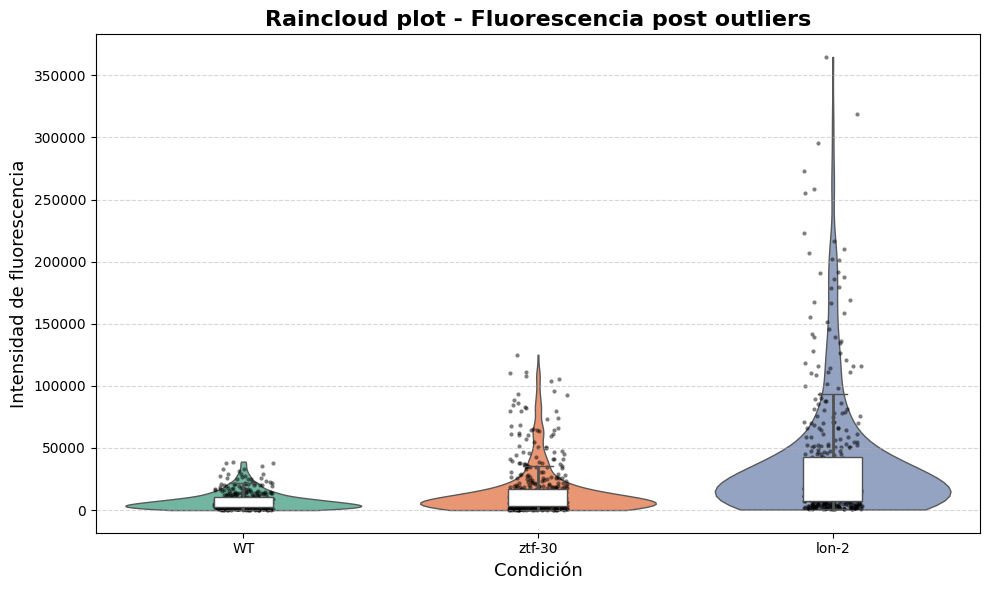

In [270]:
raincloud_plot({
    "WT": wormTrackers,
    "ztf-30": wormTrackers_ztf_30,
    "lon-2": wormTrackers_lon_2
}, post=True, titulo="Raincloud plot - Fluorescencia post outliers")

In [271]:
def clusterizar_gusanos_no_pandas(wormTrackers_dict, post=False, sigma_factor=1.0):
    """
    Clusteriza gusanos por condición usando solapamiento de media ± σ.
    
    Parameters
    ----------
    wormTrackers_dict : dict
        {"WT": [lista de trackers], "ztf-30": [...], "lon-2": [...]}
    post : bool
        Si True, usa fluorescencias post-filtrado (fluorescenciasPorGusanoCorregido).
    sigma_factor : float
        Multiplicador de sigma (ej: 1.0 para ±1σ).
    
    Returns
    -------
    dict con listas: {"Condición": [], "Cluster": [], "Gusano": [], "Fluorescencia": []}
    """
    data = {"Condición": [], "Cluster": [], "Gusano": [], "Fluorescencia": []}
    
    for cond, trackers in wormTrackers_dict.items():
        gusanos_info = []
        
        # Paso 1: medias e intervalos
        for idx, tracker in enumerate(trackers):
            dicc = tracker.fluorescenciasPorGusanoCorregido if post else tracker.fluorescenciasPorGusano
            for gusano, nucleos in dicc.items():
                valores = list(nucleos.values())
                if len(valores) == 0:
                    continue
                mean = np.mean(valores)
                std = np.std(valores, ddof=1) if len(valores) > 1 else 0
                gusanos_info.append({
                    "gusano": f"{cond}-{idx+1}-{gusano}",
                    "mean": mean,
                    "std": std,
                    "low": mean - sigma_factor*std,
                    "high": mean + sigma_factor*std,
                    "valores": valores
                })
        
        # Paso 2: clusterizar por solapamiento
        clusters = []
        gusanos_info_sorted = sorted(gusanos_info, key=lambda g: g["mean"])
        
        for g in gusanos_info_sorted:
            placed = False
            for cluster in clusters:
                if any((g["low"] <= c["high"] and g["high"] >= c["low"]) for c in cluster):
                    cluster.append(g)
                    placed = True
                    break
            if not placed:
                clusters.append([g])
        
        # Paso 3: asignar cluster IDs y guardar
        for cluster_id, cluster in enumerate(clusters, 1):
            cluster_label = f"{cond}-C{cluster_id} (n={len(cluster)})"
            for g in cluster:
                for val in g["valores"]:
                    data["Condición"].append(cond)
                    data["Cluster"].append(cluster_label)
                    data["Gusano"].append(g["gusano"])
                    data["Fluorescencia"].append(val)
    
    return data


def plot_clusters_no_pandas(data, titulo="Clusterización de gusanos por solapamiento ±σ"):
    """
    Grafica clusters de gusanos sin usar pandas.
    
    Parameters
    ----------
    data : dict
        Output de clusterizar_gusanos_no_pandas
    """
    plt.figure(figsize=(12,6))
    sns.boxplot(x=data["Condición"], y=data["Fluorescencia"], hue=data["Cluster"],
                showcaps=True, showfliers=False, boxprops={'alpha':0.6})
    sns.stripplot(x=data["Condición"], y=data["Fluorescencia"], hue=data["Cluster"],
                  dodge=True, size=3, alpha=0.5, linewidth=0.3, edgecolor="black")

    plt.title(titulo, fontsize=16, fontweight="bold")
    plt.ylabel("Fluorescencia")
    plt.xlabel("Condición")
    plt.grid(axis="y", linestyle="--", alpha=0.5)
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

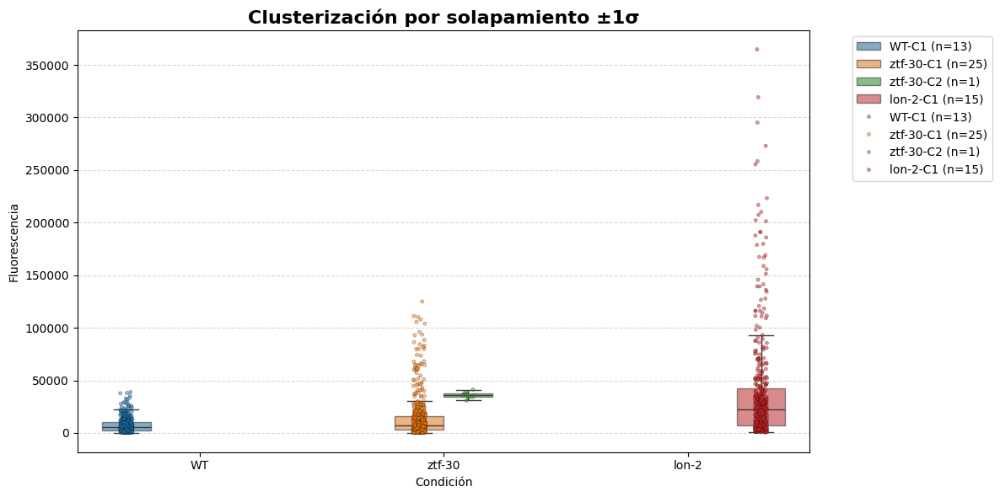

In [272]:
data_clusters = clusterizar_gusanos_no_pandas({
    "WT": wormTrackers,
    "ztf-30": wormTrackers_ztf_30,
    "lon-2": wormTrackers_lon_2
}, post=True, sigma_factor=1.0)

plot_clusters_no_pandas(data_clusters, titulo="Clusterización por solapamiento ±1σ")